In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot

# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for temperatures
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for temperatures
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for temperatures
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)
    
    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (temperatures) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 6
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

#Test model and accuracy when solar activity is removed as a predictor
df_trimmed = df_trimmed.drop(['solar_activity'], axis=1)

n_vars = df_trimmed.shape[1]-1
    
X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    #new_df = new_df.iloc[:180, :]
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['temperatures'].iloc[j])
    y.append(add_to_y)
    #new_df = new_df.drop(['temperatures'], axis=1)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df)

    #print(len(dataset))
    #print(len(dataset[0]))
    #print(len(dataset_scaling))
    #print(len(dataset_scaling[:][0]))
    #print("Stop")
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['temperatures']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['temperatures']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
    #X_train = train1[:][:-n_seq]
    #y_train = train1[:][-n_seq:]
    #X_test = test1[:][:-n_seq]
    #y_test = test1[:][-n_seq:]

print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 6
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  temperatures          slp  vapor_pressure  \
0      2006-01-31     6501     12.209677  1018.534543        8.674922   
1      2006-02-28     6501      8.174541  1021.230347        6.942276   
2      2006-03-31     6501     15.676613  1018.968548       10.468176   
3      2006-04-30     6501     22.464167  1014.686944       16.358802   
4      2006-05-31     6501     23.657258  1014.236828       18.798749   
...           ...      ...           ...          ...             ...   
24057  2024-07-31     9858     28.604704  1013.969355       23.769169   
24058  2024-08-31     9858     29.114919  1015.112097       23.699154   
24059  2024-09-30     9858     24.570278  1014.393750       16.790240   
24060  2024-10-31     9858     21.159140  1018.230376       10.994776   
24061  2024-11-30     9858     12.112917  10

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

6
179
(84, 1975)
(11, 1975)


[I 2025-05-22 20:11:04,796] A new study created in memory with name: no-name-313626d5-1219-4e27-931b-004bff6ee77a
[I 2025-05-22 20:12:35,774] Trial 0 finished with value: 0.09112092182040214 and parameters: {'lr': 0.4849097119305061, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.1565656308369434}. Best is trial 0 with value: 0.09112092182040214.


Cross Validation Accuracies:
[0.13125938177108765, 0.0567094050347805, 0.10420341044664383, 0.09389876574277878, 0.06953364610671997]
Mean Cross Validation Accuracy:
0.09112092182040214
Standard Deviation of Cross Validation Accuracy:
0.026230237715092343


[I 2025-05-22 20:15:25,926] Trial 1 finished with value: 0.06812657192349433 and parameters: {'lr': 0.006891386961975541, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.1444421559089556}. Best is trial 1 with value: 0.06812657192349433.


Cross Validation Accuracies:
[0.05408233031630516, 0.06260719150304794, 0.06859643757343292, 0.0854213535785675, 0.06992554664611816]
Mean Cross Validation Accuracy:
0.06812657192349433
Standard Deviation of Cross Validation Accuracy:
0.010298260424217264


[I 2025-05-22 20:20:00,857] Trial 2 finished with value: 0.1198764756321907 and parameters: {'lr': 0.0028163849205045215, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.18584024788072684}. Best is trial 1 with value: 0.06812657192349433.


Cross Validation Accuracies:
[0.12421317398548126, 0.10449042171239853, 0.12438032031059265, 0.12675200402736664, 0.11954645812511444]
Mean Cross Validation Accuracy:
0.1198764756321907
Standard Deviation of Cross Validation Accuracy:
0.008039950584241201


[I 2025-05-22 20:21:38,592] Trial 3 finished with value: 0.06996363922953605 and parameters: {'lr': 0.40295884927088343, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4769753440403952}. Best is trial 1 with value: 0.06812657192349433.


Cross Validation Accuracies:
[0.04824773967266083, 0.05876332148909569, 0.08586063981056213, 0.0855829119682312, 0.07136358320713043]
Mean Cross Validation Accuracy:
0.06996363922953605
Standard Deviation of Cross Validation Accuracy:
0.014803131848027354


[I 2025-05-22 20:23:47,906] Trial 4 finished with value: 0.0763244166970253 and parameters: {'lr': 0.24989427790112387, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.3491498006569579}. Best is trial 1 with value: 0.06812657192349433.


Cross Validation Accuracies:
[0.07707247138023376, 0.049293480813503265, 0.10003147274255753, 0.08128823339939117, 0.07393642514944077]
Mean Cross Validation Accuracy:
0.0763244166970253
Standard Deviation of Cross Validation Accuracy:
0.016270203236469893


[I 2025-05-22 20:26:24,438] Trial 5 finished with value: 0.26927612721920013 and parameters: {'lr': 0.013702426519225472, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.19118248615986977}. Best is trial 1 with value: 0.06812657192349433.


Cross Validation Accuracies:
[0.2683216631412506, 0.24215984344482422, 0.2815987765789032, 0.24857233464717865, 0.305728018283844]
Mean Cross Validation Accuracy:
0.26927612721920013
Standard Deviation of Cross Validation Accuracy:
0.023001908284769435


[I 2025-05-22 20:28:05,379] Trial 6 finished with value: 0.06822118535637856 and parameters: {'lr': 0.0011086114786845278, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.12841459926739432}. Best is trial 1 with value: 0.06812657192349433.


Cross Validation Accuracies:
[0.05358166992664337, 0.05297220125794411, 0.07507544755935669, 0.08423660695552826, 0.07524000108242035]
Mean Cross Validation Accuracy:
0.06822118535637856
Standard Deviation of Cross Validation Accuracy:
0.012645832053238555


[I 2025-05-22 20:32:51,256] Trial 7 finished with value: 0.14123706221580506 and parameters: {'lr': 0.0057601518468875365, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.3423356831108831}. Best is trial 1 with value: 0.06812657192349433.


Cross Validation Accuracies:
[0.1654425710439682, 0.0652369037270546, 0.17760169506072998, 0.18482470512390137, 0.11307943612337112]
Mean Cross Validation Accuracy:
0.14123706221580506
Standard Deviation of Cross Validation Accuracy:
0.045556671940203665


[I 2025-05-22 20:34:46,397] Trial 8 finished with value: 0.5054267942905426 and parameters: {'lr': 0.008414929584898374, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.38123220896370913}. Best is trial 1 with value: 0.06812657192349433.


Cross Validation Accuracies:
[0.5076532959938049, 0.5166542530059814, 0.44577524065971375, 0.5547003149986267, 0.5023508667945862]
Mean Cross Validation Accuracy:
0.5054267942905426
Standard Deviation of Cross Validation Accuracy:
0.0350047487136918


[I 2025-05-22 20:37:31,909] Trial 9 finished with value: 0.06510277092456818 and parameters: {'lr': 0.3587003309867671, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.29230069169436035}. Best is trial 9 with value: 0.06510277092456818.


Cross Validation Accuracies:
[0.05084095150232315, 0.05750511586666107, 0.06810224056243896, 0.08103135973215103, 0.06803418695926666]
Mean Cross Validation Accuracy:
0.06510277092456818
Standard Deviation of Cross Validation Accuracy:
0.010319242366469708


[I 2025-05-22 20:40:27,443] Trial 10 finished with value: 0.07680956795811653 and parameters: {'lr': 0.09680177906278822, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.25891371703531485}. Best is trial 9 with value: 0.06510277092456818.


Cross Validation Accuracies:
[0.07882586866617203, 0.06004410609602928, 0.07629748433828354, 0.10059914737939835, 0.06828123331069946]
Mean Cross Validation Accuracy:
0.07680956795811653
Standard Deviation of Cross Validation Accuracy:
0.013594741560823569


[I 2025-05-22 20:43:11,295] Trial 11 finished with value: 0.07864253669977188 and parameters: {'lr': 0.07077750507095963, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.26255502374075484}. Best is trial 9 with value: 0.06510277092456818.


Cross Validation Accuracies:
[0.060086384415626526, 0.07152799516916275, 0.0877050906419754, 0.08767802268266678, 0.08621519058942795]
Mean Cross Validation Accuracy:
0.07864253669977188
Standard Deviation of Cross Validation Accuracy:
0.011100112311306738


[I 2025-05-22 20:45:56,388] Trial 12 finished with value: 0.07818750739097595 and parameters: {'lr': 0.03482443384769997, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.10591360318585744}. Best is trial 9 with value: 0.06510277092456818.


Cross Validation Accuracies:
[0.05635146051645279, 0.07620938867330551, 0.0729762464761734, 0.10584139078855515, 0.07955905050039291]
Mean Cross Validation Accuracy:
0.07818750739097595
Standard Deviation of Cross Validation Accuracy:
0.015965597605837465


[I 2025-05-22 20:49:01,010] Trial 13 finished with value: 8.204059267044068 and parameters: {'lr': 0.8497745810738279, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.4382482603264998}. Best is trial 9 with value: 0.06510277092456818.


Cross Validation Accuracies:
[8.242433547973633, 3.2009804248809814, 9.732406616210938, 11.097517013549805, 8.74695873260498]
Mean Cross Validation Accuracy:
8.204059267044068
Standard Deviation of Cross Validation Accuracy:
2.684583903198504


[I 2025-05-22 20:52:08,761] Trial 14 finished with value: 0.07015057280659676 and parameters: {'lr': 0.017629119469985403, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2645603109491796}. Best is trial 9 with value: 0.06510277092456818.


Cross Validation Accuracies:
[0.05325693264603615, 0.06364825367927551, 0.07698388397693634, 0.09113574028015137, 0.06572805345058441]
Mean Cross Validation Accuracy:
0.07015057280659676
Standard Deviation of Cross Validation Accuracy:
0.012917471151941157


[I 2025-05-22 20:55:11,560] Trial 15 finished with value: 0.08942465633153915 and parameters: {'lr': 0.08785281873501692, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.20749259436846468}. Best is trial 9 with value: 0.06510277092456818.


Cross Validation Accuracies:
[0.06419460475444794, 0.07992595434188843, 0.09508775919675827, 0.11139192432165146, 0.09652303904294968]
Mean Cross Validation Accuracy:
0.08942465633153915
Standard Deviation of Cross Validation Accuracy:
0.01607357754950649


[I 2025-05-22 20:57:03,325] Trial 16 finished with value: 0.07610389515757561 and parameters: {'lr': 0.0031233131036563686, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.31049616193407137}. Best is trial 9 with value: 0.06510277092456818.


Cross Validation Accuracies:
[0.0720222219824791, 0.06105555221438408, 0.08803099393844604, 0.09130294620990753, 0.06810776144266129]
Mean Cross Validation Accuracy:
0.07610389515757561
Standard Deviation of Cross Validation Accuracy:
0.011664627502419676


[I 2025-05-22 21:00:17,637] Trial 17 finished with value: 0.08732857257127762 and parameters: {'lr': 0.029128945198097368, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.4003691104280112}. Best is trial 9 with value: 0.06510277092456818.


Cross Validation Accuracies:
[0.07370992004871368, 0.09653744101524353, 0.07182487100362778, 0.10510604828596115, 0.08946458250284195]
Mean Cross Validation Accuracy:
0.08732857257127762
Standard Deviation of Cross Validation Accuracy:
0.012893695343548804


[I 2025-05-22 21:03:12,387] Trial 18 finished with value: 0.06785727217793465 and parameters: {'lr': 0.17417012586315966, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.22793356875880733}. Best is trial 9 with value: 0.06510277092456818.


Cross Validation Accuracies:
[0.056413885205984116, 0.04988887161016464, 0.08625883609056473, 0.08377677202224731, 0.06294799596071243]
Mean Cross Validation Accuracy:
0.06785727217793465
Standard Deviation of Cross Validation Accuracy:
0.01462848964899869


[I 2025-05-22 21:05:10,724] Trial 19 finished with value: 6.493201759457588 and parameters: {'lr': 0.18162991943869192, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.298134513499778}. Best is trial 9 with value: 0.06510277092456818.


Cross Validation Accuracies:
[0.057865772396326065, 0.05633803829550743, 0.07589911669492722, 0.07872798293828964, 32.19717788696289]
Mean Cross Validation Accuracy:
6.493201759457588
Standard Deviation of Cross Validation Accuracy:
12.851991282544532


[I 2025-05-22 21:08:08,321] Trial 20 finished with value: 0.0792163223028183 and parameters: {'lr': 0.9796379137642801, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.24715976931702033}. Best is trial 9 with value: 0.06510277092456818.


Cross Validation Accuracies:
[0.07095006853342056, 0.0744231641292572, 0.0882149189710617, 0.08805437386035919, 0.07443908601999283]
Mean Cross Validation Accuracy:
0.0792163223028183
Standard Deviation of Cross Validation Accuracy:
0.007392066023653662


[I 2025-05-22 21:11:16,178] Trial 21 finished with value: 0.06608377993106843 and parameters: {'lr': 0.17281610131405736, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.1598203403839546}. Best is trial 9 with value: 0.06510277092456818.


Cross Validation Accuracies:
[0.051377762109041214, 0.05380391702055931, 0.07656484097242355, 0.08308107405900955, 0.06559130549430847]
Mean Cross Validation Accuracy:
0.06608377993106843
Standard Deviation of Cross Validation Accuracy:
0.012377925291242434


[I 2025-05-22 21:14:01,971] Trial 22 finished with value: 0.0662865974009037 and parameters: {'lr': 0.18178453564905425, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.22235518410519128}. Best is trial 9 with value: 0.06510277092456818.


Cross Validation Accuracies:
[0.05473325401544571, 0.04885992035269737, 0.07391903549432755, 0.08539054542779922, 0.06853023171424866]
Mean Cross Validation Accuracy:
0.0662865974009037
Standard Deviation of Cross Validation Accuracy:
0.013156121409603051


[I 2025-05-22 21:16:57,525] Trial 23 finished with value: 0.06593637615442276 and parameters: {'lr': 0.35005992700171323, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.17360320094254914}. Best is trial 9 with value: 0.06510277092456818.


Cross Validation Accuracies:
[0.054216448217630386, 0.05209070071578026, 0.07688262313604355, 0.0814383253455162, 0.0650537833571434]
Mean Cross Validation Accuracy:
0.06593637615442276
Standard Deviation of Cross Validation Accuracy:
0.011747077602089203


[I 2025-05-22 21:19:35,594] Trial 24 finished with value: 0.06854362711310387 and parameters: {'lr': 0.3710558546409837, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.1609755593365389}. Best is trial 9 with value: 0.06510277092456818.


Cross Validation Accuracies:
[0.06838373094797134, 0.051971640437841415, 0.06844701617956161, 0.08438697457313538, 0.06952877342700958]
Mean Cross Validation Accuracy:
0.06854362711310387
Standard Deviation of Cross Validation Accuracy:
0.010263019193397907


[I 2025-05-22 21:22:32,870] Trial 25 finished with value: 0.06630218103528022 and parameters: {'lr': 0.6024798672345408, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.1211107324450287}. Best is trial 9 with value: 0.06510277092456818.


Cross Validation Accuracies:
[0.06300944834947586, 0.05557006970047951, 0.06682708859443665, 0.07721307873725891, 0.06889121979475021]
Mean Cross Validation Accuracy:
0.06630218103528022
Standard Deviation of Cross Validation Accuracy:
0.007099952683637598


[I 2025-05-22 21:25:17,993] Trial 26 finished with value: 0.07022502198815346 and parameters: {'lr': 0.049262307534144345, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.30996779522584883}. Best is trial 9 with value: 0.06510277092456818.


Cross Validation Accuracies:
[0.062274862080812454, 0.06315375119447708, 0.07199323922395706, 0.08007992058992386, 0.07362333685159683]
Mean Cross Validation Accuracy:
0.07022502198815346
Standard Deviation of Cross Validation Accuracy:
0.006708234875808421


[I 2025-05-22 21:28:11,212] Trial 27 finished with value: 0.06681706234812737 and parameters: {'lr': 0.2867523020919311, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.17812141404075138}. Best is trial 9 with value: 0.06510277092456818.


Cross Validation Accuracies:
[0.05282890796661377, 0.061168182641267776, 0.07430154830217361, 0.07961560040712357, 0.0661710724234581]
Mean Cross Validation Accuracy:
0.06681706234812737
Standard Deviation of Cross Validation Accuracy:
0.009463780580405402


[I 2025-05-22 21:30:38,980] Trial 28 finished with value: 0.09667893797159195 and parameters: {'lr': 0.11925908381960866, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.20100603034609496}. Best is trial 9 with value: 0.06510277092456818.


Cross Validation Accuracies:
[0.08017034828662872, 0.10498278588056564, 0.10414712876081467, 0.08834773302078247, 0.10574669390916824]
Mean Cross Validation Accuracy:
0.09667893797159195
Standard Deviation of Cross Validation Accuracy:
0.010477542372349678


[I 2025-05-22 21:32:22,154] Trial 29 finished with value: 0.08104671090841294 and parameters: {'lr': 0.5236252527872786, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.1561379477560436}. Best is trial 9 with value: 0.06510277092456818.


Cross Validation Accuracies:
[0.05345550924539566, 0.0778893306851387, 0.09729219228029251, 0.09216632694005966, 0.08443019539117813]
Mean Cross Validation Accuracy:
0.08104671090841294
Standard Deviation of Cross Validation Accuracy:
0.015298712050522847


[I 2025-05-22 21:34:19,863] Trial 30 finished with value: 0.07827982157468796 and parameters: {'lr': 0.6251014625949627, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.10696427665308977}. Best is trial 9 with value: 0.06510277092456818.


Cross Validation Accuracies:
[0.06611797213554382, 0.05503110587596893, 0.08902903646230698, 0.11437103152275085, 0.0668499618768692]
Mean Cross Validation Accuracy:
0.07827982157468796
Standard Deviation of Cross Validation Accuracy:
0.02115266466593493


[I 2025-05-22 21:37:28,408] Trial 31 finished with value: 0.06466092243790626 and parameters: {'lr': 0.16884938321415374, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.224570763780879}. Best is trial 31 with value: 0.06466092243790626.


Cross Validation Accuracies:
[0.0518312007188797, 0.04747253283858299, 0.07100246101617813, 0.08128264546394348, 0.07171577215194702]
Mean Cross Validation Accuracy:
0.06466092243790626
Standard Deviation of Cross Validation Accuracy:
0.012855428338157338


[I 2025-05-22 21:40:21,571] Trial 32 finished with value: 0.06466661021113396 and parameters: {'lr': 0.26780928913517377, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.22916753460088518}. Best is trial 31 with value: 0.06466092243790626.


Cross Validation Accuracies:
[0.050257645547389984, 0.0495874397456646, 0.0756588727235794, 0.07948819547891617, 0.06834089756011963]
Mean Cross Validation Accuracy:
0.06466661021113396
Standard Deviation of Cross Validation Accuracy:
0.012561920690111639


[I 2025-05-22 21:43:35,209] Trial 33 finished with value: 0.068036400526762 and parameters: {'lr': 0.275996248588479, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2267137940259249}. Best is trial 31 with value: 0.06466092243790626.


Cross Validation Accuracies:
[0.05082140862941742, 0.05153003707528114, 0.07680084556341171, 0.08746207505464554, 0.07356763631105423]
Mean Cross Validation Accuracy:
0.068036400526762
Standard Deviation of Cross Validation Accuracy:
0.014516079893574398


[I 2025-05-22 21:46:18,224] Trial 34 finished with value: 0.06964985579252243 and parameters: {'lr': 0.3940739695188531, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2882653033218828}. Best is trial 31 with value: 0.06466092243790626.


Cross Validation Accuracies:
[0.0552789531648159, 0.0544649101793766, 0.06472211331129074, 0.09555056691169739, 0.07823273539543152]
Mean Cross Validation Accuracy:
0.06964985579252243
Standard Deviation of Cross Validation Accuracy:
0.015529975662102891


[I 2025-05-22 21:49:11,848] Trial 35 finished with value: 0.08724474161863327 and parameters: {'lr': 0.12627404771274287, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.23380170128934577}. Best is trial 31 with value: 0.06466092243790626.


Cross Validation Accuracies:
[0.07443293929100037, 0.06473108381032944, 0.12131042033433914, 0.08949807286262512, 0.08625119179487228]
Mean Cross Validation Accuracy:
0.08724474161863327
Standard Deviation of Cross Validation Accuracy:
0.019170509519054947


[I 2025-05-22 21:51:59,130] Trial 36 finished with value: 0.0722259171307087 and parameters: {'lr': 0.06011857665189636, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.28217393477885666}. Best is trial 31 with value: 0.06466092243790626.


Cross Validation Accuracies:
[0.06690558791160583, 0.05232597514986992, 0.08139370381832123, 0.09394576400518417, 0.06655855476856232]
Mean Cross Validation Accuracy:
0.0722259171307087
Standard Deviation of Cross Validation Accuracy:
0.014228370609345894


[I 2025-05-22 21:56:36,846] Trial 37 finished with value: 2.824134111404419 and parameters: {'lr': 0.2839576351600869, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.1832800091556255}. Best is trial 31 with value: 0.06466092243790626.


Cross Validation Accuracies:
[1.496430516242981, 1.2195600271224976, 4.068412780761719, 2.6599271297454834, 4.676340103149414]
Mean Cross Validation Accuracy:
2.824134111404419
Standard Deviation of Cross Validation Accuracy:
1.3669905050330777


[I 2025-05-22 21:58:30,416] Trial 38 finished with value: 0.07250896766781807 and parameters: {'lr': 0.6986856300458272, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3313977593857182}. Best is trial 31 with value: 0.06466092243790626.


Cross Validation Accuracies:
[0.05612365901470184, 0.05015462264418602, 0.08274225145578384, 0.08108974993228912, 0.09243455529212952]
Mean Cross Validation Accuracy:
0.07250896766781807
Standard Deviation of Cross Validation Accuracy:
0.01639252295787861


[I 2025-05-22 21:59:58,841] Trial 39 finished with value: 0.08019171059131622 and parameters: {'lr': 0.4498015664260366, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.493436243081755}. Best is trial 31 with value: 0.06466092243790626.


Cross Validation Accuracies:
[0.08325004577636719, 0.05269218981266022, 0.10320773720741272, 0.08055330067873001, 0.08125527948141098]
Mean Cross Validation Accuracy:
0.08019171059131622
Standard Deviation of Cross Validation Accuracy:
0.016103269634009175


[I 2025-05-22 22:04:48,336] Trial 40 finished with value: 0.1821867674589157 and parameters: {'lr': 0.35092403969933395, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.36611558574561354}. Best is trial 31 with value: 0.06466092243790626.


Cross Validation Accuracies:
[0.1750647872686386, 0.1721288114786148, 0.1733413189649582, 0.18641871213912964, 0.2039802074432373]
Mean Cross Validation Accuracy:
0.1821867674589157
Standard Deviation of Cross Validation Accuracy:
0.012024894357276023


[I 2025-05-22 22:07:34,239] Trial 41 finished with value: 0.07222929745912551 and parameters: {'lr': 0.17785136246183342, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.15781603089167176}. Best is trial 31 with value: 0.06466092243790626.


Cross Validation Accuracies:
[0.05539798364043236, 0.04894539341330528, 0.07614263147115707, 0.10181477665901184, 0.07884570211172104]
Mean Cross Validation Accuracy:
0.07222929745912551
Standard Deviation of Cross Validation Accuracy:
0.018760729653090853


[I 2025-05-22 22:10:16,234] Trial 42 finished with value: 0.06696562767028809 and parameters: {'lr': 0.22692057727432094, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.14181788806384688}. Best is trial 31 with value: 0.06466092243790626.


Cross Validation Accuracies:
[0.0517900325357914, 0.060790326446294785, 0.06836660206317902, 0.08503948897123337, 0.06884168833494186]
Mean Cross Validation Accuracy:
0.06696562767028809
Standard Deviation of Cross Validation Accuracy:
0.010959742953974947


[I 2025-05-22 22:12:52,576] Trial 43 finished with value: 0.07294710129499435 and parameters: {'lr': 0.11072145431109436, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.20210208949725092}. Best is trial 31 with value: 0.06466092243790626.


Cross Validation Accuracies:
[0.05296097695827484, 0.07708193361759186, 0.0742914155125618, 0.09139027446508408, 0.0690109059214592]
Mean Cross Validation Accuracy:
0.07294710129499435
Standard Deviation of Cross Validation Accuracy:
0.01244181221249477


[I 2025-05-22 22:15:36,482] Trial 44 finished with value: 0.0714490607380867 and parameters: {'lr': 0.14502978500899932, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.17105367491072884}. Best is trial 31 with value: 0.06466092243790626.


Cross Validation Accuracies:
[0.05876299366354942, 0.051586274057626724, 0.08739110082387924, 0.0896962434053421, 0.06980869174003601]
Mean Cross Validation Accuracy:
0.0714490607380867
Standard Deviation of Cross Validation Accuracy:
0.015134501778202579


[I 2025-05-22 22:18:09,579] Trial 45 finished with value: 0.0691976360976696 and parameters: {'lr': 0.07944028518321791, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.27524222729420583}. Best is trial 31 with value: 0.06466092243790626.


Cross Validation Accuracies:
[0.04975425824522972, 0.05182540416717529, 0.07964319735765457, 0.09530560672283173, 0.0694597139954567]
Mean Cross Validation Accuracy:
0.0691976360976696
Standard Deviation of Cross Validation Accuracy:
0.017150183378521474


[I 2025-05-22 22:19:40,696] Trial 46 finished with value: 0.06525047197937965 and parameters: {'lr': 0.235763883858013, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.19314757637096158}. Best is trial 31 with value: 0.06466092243790626.


Cross Validation Accuracies:
[0.050803229212760925, 0.05162601172924042, 0.07934488356113434, 0.08282792568206787, 0.06165030971169472]
Mean Cross Validation Accuracy:
0.06525047197937965
Standard Deviation of Cross Validation Accuracy:
0.013527226068377448


[I 2025-05-22 22:21:13,244] Trial 47 finished with value: 0.06860784068703651 and parameters: {'lr': 0.22929249441784852, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.24478828082820997}. Best is trial 31 with value: 0.06466092243790626.


Cross Validation Accuracies:
[0.0566936619579792, 0.06085585057735443, 0.06774812936782837, 0.09359004348516464, 0.06415151804685593]
Mean Cross Validation Accuracy:
0.06860784068703651
Standard Deviation of Cross Validation Accuracy:
0.013013449789514632


[I 2025-05-22 22:23:07,366] Trial 48 finished with value: 0.08994920328259468 and parameters: {'lr': 0.0010039366563214475, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.20831653584409274}. Best is trial 31 with value: 0.06466092243790626.


Cross Validation Accuracies:
[0.05261391028761864, 0.09522728621959686, 0.10073406249284744, 0.08767156302928925, 0.11349919438362122]
Mean Cross Validation Accuracy:
0.08994920328259468
Standard Deviation of Cross Validation Accuracy:
0.02048357965140596


[I 2025-05-22 22:24:42,508] Trial 49 finished with value: 0.07325653806328773 and parameters: {'lr': 0.7640792788915385, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.24821687483678792}. Best is trial 31 with value: 0.06466092243790626.


Cross Validation Accuracies:
[0.05384695902466774, 0.052716270089149475, 0.08398150652647018, 0.1002148687839508, 0.07552308589220047]
Mean Cross Validation Accuracy:
0.07325653806328773
Standard Deviation of Cross Validation Accuracy:
0.018141378942889096


[I 2025-05-22 22:26:15,013] Trial 50 finished with value: 0.06465507000684738 and parameters: {'lr': 0.03857497044166924, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.19386836191566603}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.051007986068725586, 0.04874471575021744, 0.07474925369024277, 0.08266618847846985, 0.06610720604658127]
Mean Cross Validation Accuracy:
0.06465507000684738
Standard Deviation of Cross Validation Accuracy:
0.0131740950694645


[I 2025-05-22 22:27:50,078] Trial 51 finished with value: 0.07524589970707893 and parameters: {'lr': 0.015326062883089615, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.13173529922333255}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.051338206976652145, 0.09234822541475296, 0.07059163600206375, 0.08646588772535324, 0.07548554241657257]
Mean Cross Validation Accuracy:
0.07524589970707893
Standard Deviation of Cross Validation Accuracy:
0.014224451108553356


[I 2025-05-22 22:29:24,764] Trial 52 finished with value: 0.07127808555960655 and parameters: {'lr': 0.0064706882277516375, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.19345685625078854}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.05434573069214821, 0.05419956147670746, 0.09539690613746643, 0.08650754392147064, 0.06594068557024002]
Mean Cross Validation Accuracy:
0.07127808555960655
Standard Deviation of Cross Validation Accuracy:
0.016855398974316472


[I 2025-05-22 22:30:59,266] Trial 53 finished with value: 0.06550084501504898 and parameters: {'lr': 0.026282273082674973, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.20707941814213562}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.050075408071279526, 0.0508689321577549, 0.07589519023895264, 0.08312179148197174, 0.0675429031252861]
Mean Cross Validation Accuracy:
0.06550084501504898
Standard Deviation of Cross Validation Accuracy:
0.013226845029099623


[I 2025-05-22 22:32:27,124] Trial 54 finished with value: 0.06636670753359794 and parameters: {'lr': 0.023175177677610816, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.2658997704881015}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.05705295503139496, 0.051429565995931625, 0.0749308317899704, 0.08200258761644363, 0.06641759723424911]
Mean Cross Validation Accuracy:
0.06636670753359794
Standard Deviation of Cross Validation Accuracy:
0.01120438970220082


[I 2025-05-22 22:33:56,697] Trial 55 finished with value: 0.0655427947640419 and parameters: {'lr': 0.04142792366881426, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.216207803492802}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.052590612322092056, 0.05007246509194374, 0.0791473537683487, 0.08174098283052444, 0.06416255980730057]
Mean Cross Validation Accuracy:
0.0655427947640419
Standard Deviation of Cross Validation Accuracy:
0.0130878607957723


[I 2025-05-22 22:35:31,455] Trial 56 finished with value: 0.09246097505092621 and parameters: {'lr': 0.009121494228183133, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.23871405829710704}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.12953266501426697, 0.08183085173368454, 0.09007711708545685, 0.07901749014854431, 0.08184675127267838]
Mean Cross Validation Accuracy:
0.09246097505092621
Standard Deviation of Cross Validation Accuracy:
0.018901754045657502


[I 2025-05-22 22:37:01,931] Trial 57 finished with value: 0.06593062579631806 and parameters: {'lr': 0.02238819585526108, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.2153012854182335}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.052791450172662735, 0.05242526903748512, 0.07465812563896179, 0.08447534590959549, 0.06530293822288513]
Mean Cross Validation Accuracy:
0.06593062579631806
Standard Deviation of Cross Validation Accuracy:
0.012453935012883258


[I 2025-05-22 22:38:33,311] Trial 58 finished with value: 0.0669493854045868 and parameters: {'lr': 0.011001842536054938, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.18690647365874383}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.05446314439177513, 0.05147174373269081, 0.07586251944303513, 0.0861232578754425, 0.06682626157999039]
Mean Cross Validation Accuracy:
0.0669493854045868
Standard Deviation of Cross Validation Accuracy:
0.012981218045667356


[I 2025-05-22 22:40:26,633] Trial 59 finished with value: 0.06591258794069291 and parameters: {'lr': 0.05783460523523412, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.324251348832712}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.05254998430609703, 0.05193977430462837, 0.07945180684328079, 0.08057606965303421, 0.0650453045964241]
Mean Cross Validation Accuracy:
0.06591258794069291
Standard Deviation of Cross Validation Accuracy:
0.012432851817850263


[I 2025-05-22 22:42:46,859] Trial 60 finished with value: 0.08445432484149933 and parameters: {'lr': 0.003637079519329913, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.41454414580853965}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.05957750976085663, 0.06964696943759918, 0.08169512450695038, 0.08725664764642715, 0.1240953728556633]
Mean Cross Validation Accuracy:
0.08445432484149933
Standard Deviation of Cross Validation Accuracy:
0.02202268189782684


[I 2025-05-22 22:45:56,766] Trial 61 finished with value: 0.06509068086743355 and parameters: {'lr': 0.033361019487326206, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.2231860389335255}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.05220862478017807, 0.04931117221713066, 0.07396458089351654, 0.08566208183765411, 0.06430694460868835]
Mean Cross Validation Accuracy:
0.06509068086743355
Standard Deviation of Cross Validation Accuracy:
0.013546092752922954


[I 2025-05-22 22:49:54,936] Trial 62 finished with value: 0.06659117266535759 and parameters: {'lr': 0.029211920170541417, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.25654574239093647}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.05668160691857338, 0.04807237535715103, 0.07917536795139313, 0.08370694518089294, 0.06531956791877747]
Mean Cross Validation Accuracy:
0.06659117266535759
Standard Deviation of Cross Validation Accuracy:
0.013372164861864641


[I 2025-05-22 22:54:27,435] Trial 63 finished with value: 0.0655946359038353 and parameters: {'lr': 0.04248882153131019, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.19477313429265936}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.05457045137882233, 0.049588561058044434, 0.07335622608661652, 0.08422047644853592, 0.06623746454715729]
Mean Cross Validation Accuracy:
0.0655946359038353
Standard Deviation of Cross Validation Accuracy:
0.012532394210503667


[I 2025-05-22 22:59:18,308] Trial 64 finished with value: 0.06630883142352104 and parameters: {'lr': 0.021876085840494906, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.2264888261644088}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.05127386748790741, 0.04795655980706215, 0.07727313041687012, 0.08831063657999039, 0.06672996282577515]
Mean Cross Validation Accuracy:
0.06630883142352104
Standard Deviation of Cross Validation Accuracy:
0.015279585388656633


[I 2025-05-22 23:05:26,552] Trial 65 finished with value: 0.31147641837596896 and parameters: {'lr': 0.03454662806944559, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.21495902775545742}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.17228400707244873, 0.3998986482620239, 0.21025492250919342, 0.38098061084747314, 0.39396390318870544]
Mean Cross Validation Accuracy:
0.31147641837596896
Standard Deviation of Cross Validation Accuracy:
0.09906949808075712


[I 2025-05-22 23:13:37,265] Trial 66 finished with value: 0.06466688215732574 and parameters: {'lr': 0.07544825756989852, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.16797972820801993}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.05080028995871544, 0.04859909042716026, 0.07656592130661011, 0.08196605741977692, 0.065403051674366]
Mean Cross Validation Accuracy:
0.06466688215732574
Standard Deviation of Cross Validation Accuracy:
0.013355499640833796


[I 2025-05-22 23:20:07,178] Trial 67 finished with value: 0.06767862066626548 and parameters: {'lr': 0.07687788885685215, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.17565808435727032}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.05293264612555504, 0.05769707262516022, 0.07316865772008896, 0.08503714203834534, 0.06955758482217789]
Mean Cross Validation Accuracy:
0.06767862066626548
Standard Deviation of Cross Validation Accuracy:
0.01141984539149882


[I 2025-05-22 23:27:29,536] Trial 68 finished with value: 2.1457737565040587 and parameters: {'lr': 0.10934847788883528, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.14690981999186115}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[2.275087356567383, 2.875779867172241, 2.3548552989959717, 2.647101640701294, 0.5760446190834045]
Mean Cross Validation Accuracy:
2.1457737565040587
Standard Deviation of Cross Validation Accuracy:
0.813477133363451


[I 2025-05-22 23:32:28,885] Trial 69 finished with value: 0.07225527837872506 and parameters: {'lr': 0.1441741394495709, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.23375188871517247}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.059996213763952255, 0.05567573010921478, 0.0782683715224266, 0.09416458755731583, 0.07317148894071579]
Mean Cross Validation Accuracy:
0.07225527837872506
Standard Deviation of Cross Validation Accuracy:
0.0137272039810153


[I 2025-05-22 23:37:18,227] Trial 70 finished with value: 0.06639566794037818 and parameters: {'lr': 0.09709461289800123, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.2697038080416869}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.05301414430141449, 0.05178695544600487, 0.07473453879356384, 0.08560394495725632, 0.06683875620365143]
Mean Cross Validation Accuracy:
0.06639566794037818
Standard Deviation of Cross Validation Accuracy:
0.012893181577218957


[I 2025-05-22 23:42:34,499] Trial 71 finished with value: 0.06552516669034958 and parameters: {'lr': 0.054363681122856264, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.2021751155063696}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.05163295567035675, 0.05155879259109497, 0.0751534104347229, 0.08287813514471054, 0.06640253961086273]
Mean Cross Validation Accuracy:
0.06552516669034958
Standard Deviation of Cross Validation Accuracy:
0.012511207036294304


[I 2025-05-22 23:49:46,003] Trial 72 finished with value: 0.06683247238397598 and parameters: {'lr': 0.041865499343855854, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.1706316186575291}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.05753667652606964, 0.04965332895517349, 0.07749587297439575, 0.08412445336580276, 0.06535203009843826]
Mean Cross Validation Accuracy:
0.06683247238397598
Standard Deviation of Cross Validation Accuracy:
0.01262099217468792


[I 2025-05-22 23:56:11,429] Trial 73 finished with value: 0.0756846122443676 and parameters: {'lr': 0.0014063846072114158, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.25097846049900496}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.05048948526382446, 0.05249246582388878, 0.08659733831882477, 0.09142287075519562, 0.09742090106010437]
Mean Cross Validation Accuracy:
0.0756846122443676
Standard Deviation of Cross Validation Accuracy:
0.02005949501839731


[I 2025-05-23 00:02:09,971] Trial 74 finished with value: 0.1827748417854309 and parameters: {'lr': 0.5267511893105474, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.29945129276350185}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.06981560587882996, 0.045116126537323, 0.08337164670228958, 0.6433587074279785, 0.07221212238073349]
Mean Cross Validation Accuracy:
0.1827748417854309
Standard Deviation of Cross Validation Accuracy:
0.23063057831323844


[I 2025-05-23 00:07:37,230] Trial 75 finished with value: 0.07185036316514015 and parameters: {'lr': 0.22461866510832135, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.19100263532207237}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.05123472213745117, 0.06181246414780617, 0.0778900682926178, 0.09585339576005936, 0.07246116548776627]
Mean Cross Validation Accuracy:
0.07185036316514015
Standard Deviation of Cross Validation Accuracy:
0.015091459590918876


[I 2025-05-23 00:14:26,579] Trial 76 finished with value: 0.06893487945199013 and parameters: {'lr': 0.31510217887778175, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.22058380839878064}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.05181210860610008, 0.047964394092559814, 0.07051245123147964, 0.10117551684379578, 0.07320992648601532]
Mean Cross Validation Accuracy:
0.06893487945199013
Standard Deviation of Cross Validation Accuracy:
0.01893765559378145


[I 2025-05-23 00:19:17,652] Trial 77 finished with value: 0.06919499412178994 and parameters: {'lr': 0.06601210523818286, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.14083610132965324}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.0549934059381485, 0.049151454120874405, 0.08357876539230347, 0.08793506771326065, 0.07031627744436264]
Mean Cross Validation Accuracy:
0.06919499412178994
Standard Deviation of Cross Validation Accuracy:
0.015249715493554057


[I 2025-05-23 00:25:34,298] Trial 78 finished with value: 0.06647227555513383 and parameters: {'lr': 0.024954248657882108, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.16456292870032777}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.05844797194004059, 0.051799431443214417, 0.07405880838632584, 0.08006007224321365, 0.0679950937628746]
Mean Cross Validation Accuracy:
0.06647227555513383
Standard Deviation of Cross Validation Accuracy:
0.010238988986897688


[I 2025-05-23 00:31:11,014] Trial 79 finished with value: 2.8607914090156554 and parameters: {'lr': 0.43027823701431056, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.12037824712403339}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[2.3552069664001465, 0.6161723732948303, 2.363375186920166, 4.113377094268799, 4.855825424194336]
Mean Cross Validation Accuracy:
2.8607914090156554
Standard Deviation of Cross Validation Accuracy:
1.4893276847463708


[I 2025-05-23 00:37:49,201] Trial 80 finished with value: 0.07153142318129539 and parameters: {'lr': 0.017147071301792296, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.20723654876539283}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.08114950358867645, 0.05345087870955467, 0.07458535581827164, 0.08404486626386642, 0.06442651152610779]
Mean Cross Validation Accuracy:
0.07153142318129539
Standard Deviation of Cross Validation Accuracy:
0.011276578302635915


[I 2025-05-23 00:43:01,344] Trial 81 finished with value: 0.0674819640815258 and parameters: {'lr': 0.053554690072620176, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.20120058399816387}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.055139150470495224, 0.052977897226810455, 0.07504092156887054, 0.0894964337348938, 0.06475541740655899]
Mean Cross Validation Accuracy:
0.0674819640815258
Standard Deviation of Cross Validation Accuracy:
0.013504975174712556


[I 2025-05-23 00:50:01,429] Trial 82 finished with value: 0.06574486792087555 and parameters: {'lr': 0.04751201381256656, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.17768380024531424}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.05400047078728676, 0.05321330204606056, 0.07386454939842224, 0.08327624201774597, 0.06436977535486221]
Mean Cross Validation Accuracy:
0.06574486792087555
Standard Deviation of Cross Validation Accuracy:
0.011577047912940633


[I 2025-05-23 00:55:15,610] Trial 83 finished with value: 0.0653401032090187 and parameters: {'lr': 0.03731188591945188, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.23838489413155725}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.05430831015110016, 0.05027414858341217, 0.07316292822360992, 0.08233997225761414, 0.06661515682935715]
Mean Cross Validation Accuracy:
0.0653401032090187
Standard Deviation of Cross Validation Accuracy:
0.01183639596724121


[I 2025-05-23 00:59:51,248] Trial 84 finished with value: 0.06568491160869598 and parameters: {'lr': 0.034787285721553984, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.22792879581995548}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.04986095800995827, 0.05367683991789818, 0.07621236145496368, 0.08325393497943878, 0.06542046368122101]
Mean Cross Validation Accuracy:
0.06568491160869598
Standard Deviation of Cross Validation Accuracy:
0.012760556480029219


[I 2025-05-23 01:04:45,460] Trial 85 finished with value: 0.12826219648122789 and parameters: {'lr': 0.20116040125373413, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.23819543597670398}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.12817801535129547, 0.13624319434165955, 0.1305914670228958, 0.13713687658309937, 0.10916142910718918]
Mean Cross Validation Accuracy:
0.12826219648122789
Standard Deviation of Cross Validation Accuracy:
0.01012648187432169


[I 2025-05-23 01:10:39,267] Trial 86 finished with value: 0.06974028199911117 and parameters: {'lr': 0.14484571146946196, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2881899779150881}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.05638652667403221, 0.053788427263498306, 0.07626456022262573, 0.0921972468495369, 0.07006464898586273]
Mean Cross Validation Accuracy:
0.06974028199911117
Standard Deviation of Cross Validation Accuracy:
0.013998365199989222


[I 2025-05-23 01:15:31,457] Trial 87 finished with value: 0.06672573164105415 and parameters: {'lr': 0.02845888599311659, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.35424375510892003}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.053168561309576035, 0.054271481931209564, 0.075580894947052, 0.08369936794042587, 0.0669083520770073]
Mean Cross Validation Accuracy:
0.06672573164105415
Standard Deviation of Cross Validation Accuracy:
0.011878188412840928


[I 2025-05-23 01:21:25,807] Trial 88 finished with value: 0.0690247192978859 and parameters: {'lr': 0.01914012615568543, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.21150148068330113}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.0573929101228714, 0.0560586079955101, 0.076455257833004, 0.08594012260437012, 0.06927669793367386]
Mean Cross Validation Accuracy:
0.0690247192978859
Standard Deviation of Cross Validation Accuracy:
0.0113562871764088


[I 2025-05-23 01:26:10,832] Trial 89 finished with value: 0.06687412410974503 and parameters: {'lr': 0.012917908086455326, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.15039870160179006}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.05669692903757095, 0.053447723388671875, 0.07401134073734283, 0.08418764173984528, 0.06602698564529419]
Mean Cross Validation Accuracy:
0.06687412410974503
Standard Deviation of Cross Validation Accuracy:
0.011271725097383459


[I 2025-05-23 01:29:50,931] Trial 90 finished with value: 0.06944101303815842 and parameters: {'lr': 0.06795556957850934, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.259874193588155}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.062183257192373276, 0.05194384232163429, 0.07071192562580109, 0.09206287562847137, 0.07030316442251205]
Mean Cross Validation Accuracy:
0.06944101303815842
Standard Deviation of Cross Validation Accuracy:
0.01321312373263938


[I 2025-05-23 01:34:16,762] Trial 91 finished with value: 0.06550248041749 and parameters: {'lr': 0.03844500971716139, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.1862865622346865}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.05310609191656113, 0.05132576450705528, 0.07680249214172363, 0.0800369456410408, 0.06624110788106918]
Mean Cross Validation Accuracy:
0.06550248041749
Standard Deviation of Cross Validation Accuracy:
0.01178249750013564


[I 2025-05-23 01:38:47,809] Trial 92 finished with value: 0.07296966090798378 and parameters: {'lr': 0.09356299287642274, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.1853850613251552}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.09158848971128464, 0.052393730729818344, 0.07524178177118301, 0.08158290386199951, 0.06404139846563339]
Mean Cross Validation Accuracy:
0.07296966090798378
Standard Deviation of Cross Validation Accuracy:
0.013631537303948782


[I 2025-05-23 01:42:42,691] Trial 93 finished with value: 0.06740046292543411 and parameters: {'lr': 0.037052571245034395, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.1950728837698919}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.05260830745100975, 0.053963448852300644, 0.07921132445335388, 0.08394701778888702, 0.06727221608161926]
Mean Cross Validation Accuracy:
0.06740046292543411
Standard Deviation of Cross Validation Accuracy:
0.012748824149034534


[I 2025-05-23 01:46:19,713] Trial 94 finished with value: 0.0651547722518444 and parameters: {'lr': 0.027063433378041086, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.2450205648281294}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.05045861005783081, 0.04972640052437782, 0.07364170253276825, 0.08409520983695984, 0.06785193830728531]
Mean Cross Validation Accuracy:
0.0651547722518444
Standard Deviation of Cross Validation Accuracy:
0.013357055840515025


[I 2025-05-23 01:51:58,542] Trial 95 finished with value: 0.06514480412006378 and parameters: {'lr': 0.02886849238617087, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2422634191654781}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.051588501781225204, 0.049303244799375534, 0.07619528472423553, 0.08373420685529709, 0.06490278244018555]
Mean Cross Validation Accuracy:
0.06514480412006378
Standard Deviation of Cross Validation Accuracy:
0.013434775211683236


[I 2025-05-23 01:58:54,647] Trial 96 finished with value: 0.07214634791016579 and parameters: {'lr': 0.2570862523120586, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.27884808916238746}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.06028715521097183, 0.04919284209609032, 0.08411150425672531, 0.08670245856046677, 0.08043777942657471]
Mean Cross Validation Accuracy:
0.07214634791016579
Standard Deviation of Cross Validation Accuracy:
0.014773605117818264


[I 2025-05-23 02:05:14,077] Trial 97 finished with value: 0.0668536052107811 and parameters: {'lr': 0.01908457399176514, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.24390040330104806}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.05434776470065117, 0.0524679534137249, 0.08118654042482376, 0.08050895482301712, 0.06575681269168854]
Mean Cross Validation Accuracy:
0.0668536052107811
Standard Deviation of Cross Validation Accuracy:
0.012299980351230071


[I 2025-05-23 02:11:52,391] Trial 98 finished with value: 0.07281485125422478 and parameters: {'lr': 0.029893345883926063, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.22971031937096814}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[0.057616159319877625, 0.05413996800780296, 0.08014559745788574, 0.08987932652235031, 0.08229320496320724]
Mean Cross Validation Accuracy:
0.07281485125422478
Standard Deviation of Cross Validation Accuracy:
0.014244485570874188


[I 2025-05-23 02:20:59,359] Trial 99 finished with value: 31.35616455078125 and parameters: {'lr': 0.32617060859412783, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.25472204898810763}. Best is trial 50 with value: 0.06465507000684738.


Cross Validation Accuracies:
[37.476287841796875, 36.66960906982422, 37.01335144042969, 22.55524444580078, 23.066329956054688]
Mean Cross Validation Accuracy:
31.35616455078125
Standard Deviation of Cross Validation Accuracy:
6.983837305676079
Number of finished trials: 100
Best trial: {'lr': 0.03857497044166924, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.19386836191566603}
Best hyperparameters:  {'lr': 0.03857497044166924, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.19386836191566603}
Fold 1:
Epoch 1/100
84/84 [==============================] - 28s 148ms/step - loss: 0.5145 - val_loss: 0.1893
Epoch 2/100
84/84 [==============================] - 11s 134ms/step - loss: 0.0749 - val_loss: 0.2051
Epoch 3/100
84/84 [==============================] - 13s 151ms/step - loss: 0.0703 - val_loss: 0.1867
Epoch 4/100
84/84 [==============================] - 13s 159ms/step - loss: 0.0775 - val_loss: 0.1918
Ep

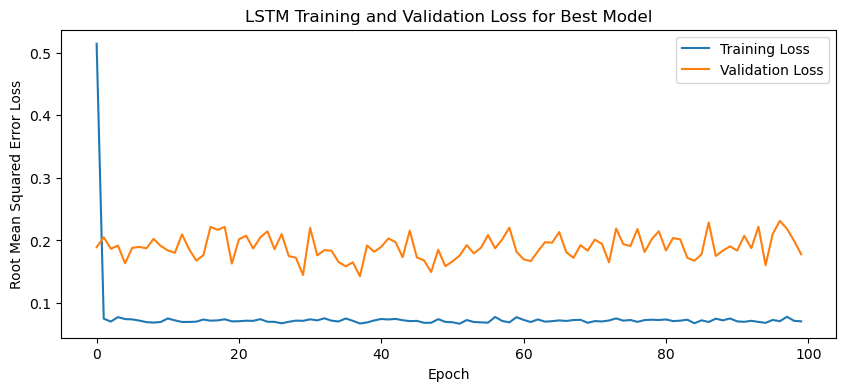

1/1 - 3s - loss: 0.0547 - 3s/epoch - 3s/step
Test Loss: 0.05467557534575462
1/1 [==============================] - 0s 97ms/step


IndexError: index 10 is out of bounds for axis 0 with size 10

In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit an LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):

    cv_accuracies = []
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

# make forecast with the LSTM best model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test):
    # plot the entire dataset in blue
    plt.plot(series.values)
    # plot the forecasts in red
    for i in range(len(forecasts)):
        off_s = len(series) - n_test + i - 1
        off_e = off_s + len(forecasts[i]) + 1
        xaxis = [x for x in range(off_s, off_e)]
        yaxis = [series.values[off_s]] + forecasts[i]
        plt.plot(xaxis, yaxis, color='red')
    # show the plot
    plt.show()
    
def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

n_batch = 1
nb_epoch = 100

# optimize and fit model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

for i in range(5):
    print("Fold "+str(i+1)+":")
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
    X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
    X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (temperatures)
    
    X = X.reshape(X.shape[0], 1, X.shape[1])
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history=best_model.fit(X, y, epochs=nb_epoch, batch_size=n_batch, validation_data=(X_val, y_val))

    # Plotting the training and validation loss
    plt.figure(figsize=(10, 4))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title1 = "LSTM Training and Validation Loss for Best Model"
    plt.title(title1)
    plt.xlabel('Epoch')
    plt.ylabel('Root Mean Squared Error Loss')
    plt.legend()
    plt.show()

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction
    
    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    for j in range(len(X_test)):
        print("Weather Station "+str(j+1)+":")
        dataset_df = pd.DataFrame(y_test[j].flatten())
        dataset = dataset_df.values
        dataset = dataset[:, 0]
        dataset = np.array(dataset).reshape(-1, 1)
        dataset = dataset.flatten()
        dataset = pd.DataFrame(dataset)
        series = scaler[i].inverse_transform(dataset)
        series = pd.Series(series.flatten())

    # plot forecasts
    plot_forecasts(series, forecasts, 1)
    
    best_model.summary()

    # Print out table of actual and predicted values for each weather station
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")

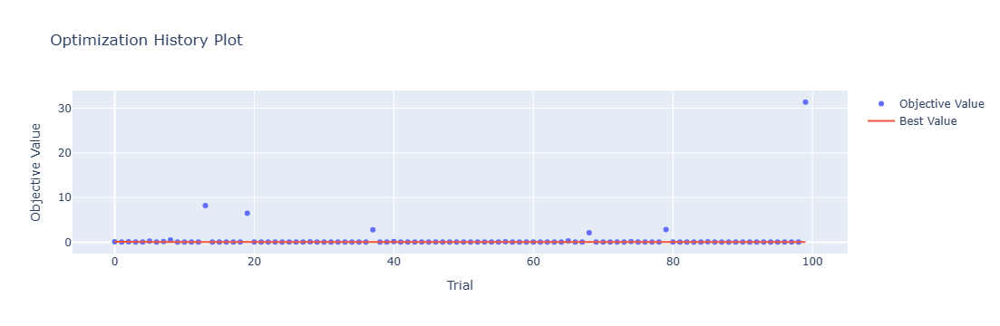

In [4]:
optuna.visualization.plot_optimization_history(study)

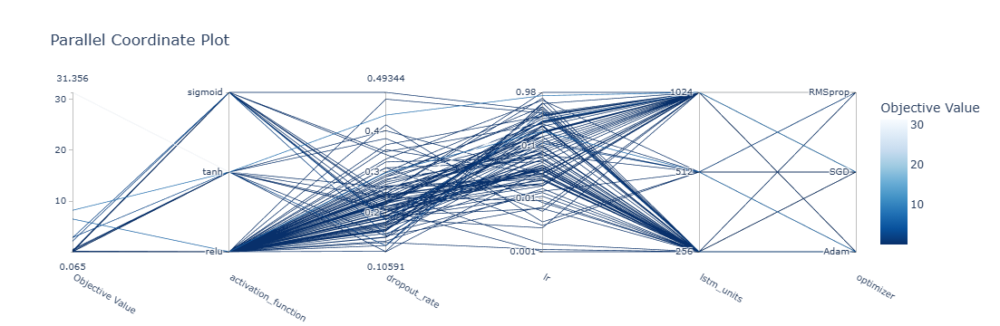

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

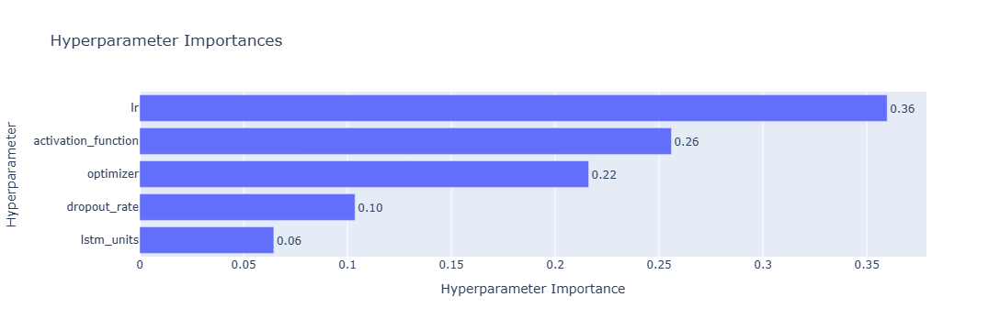

In [6]:
optuna.visualization.plot_param_importances(study)

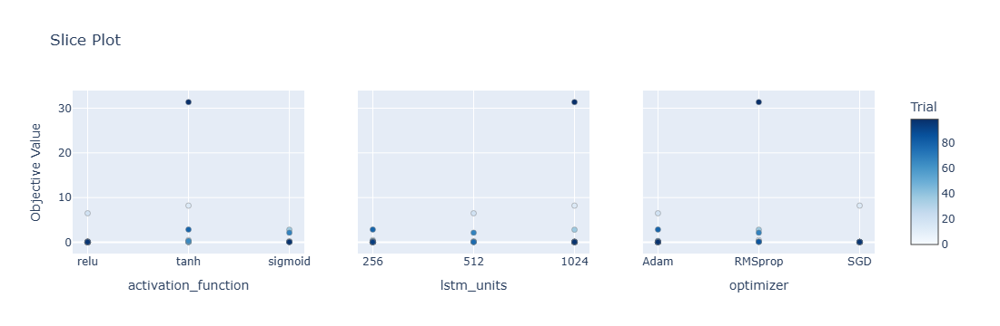

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

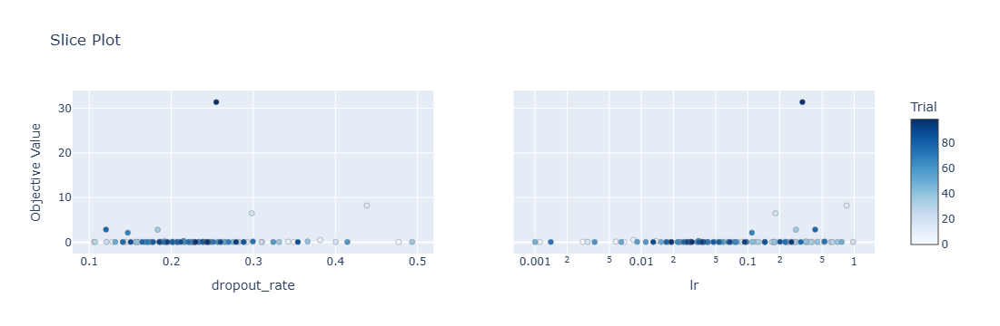

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

[[12.21  8.17 15.68 ... 23.86 20.59 15.82]
 [14.52 12.85 16.77 ... 26.49 23.17 21.15]
 [ 8.91  6.23 11.39 ... 22.62 16.72 14.05]
 ...
 [ 7.87  5.76 10.62 ... 21.07 15.24 12.04]
 [ 6.49  2.73  9.77 ... 21.93 16.5  11.44]
 [ 5.29  1.27  5.84 ... 22.11 15.37  9.87]]
Epoch 1/100
84/84 [==============================] - 49s 290ms/step - loss: 0.6128 - accuracy: 0.5595 - mae: 0.5289 - rmse: 0.6128 - mape: 86.5679 - pearson: 0.6066 - val_loss: 0.0866 - val_accuracy: 0.6000 - val_mae: 0.0727 - val_rmse: 0.0866 - val_mape: 11.9987 - val_pearson: 0.7495
Epoch 2/100
84/84 [==============================] - 19s 224ms/step - loss: 0.0746 - accuracy: 0.7262 - mae: 0.0603 - rmse: 0.0746 - mape: 10.5267 - pearson: 0.7862 - val_loss: 0.0697 - val_accuracy: 0.6000 - val_mae: 0.0554 - val_rmse: 0.0697 - val_mape: 9.8343 - val_pearson: 0.7933
Epoch 3/100
84/84 [==============================] - 18s 220ms/step - loss: 0.0720 - accuracy: 0.7738 - mae: 0.0580 - rmse: 0.0720 - mape: 10.2961 - pearson: 0.7897 

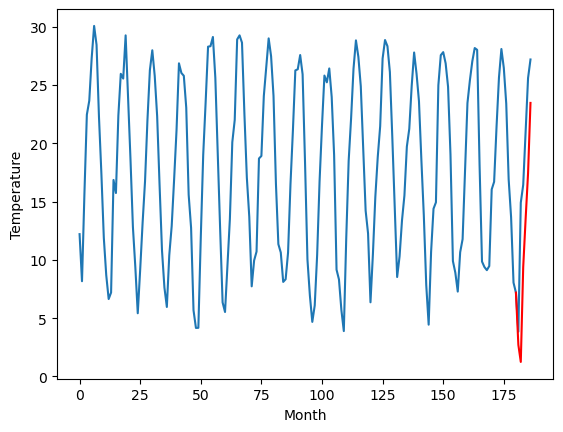

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.87		9.63		-3.24
12.78		8.16		-4.62
17.84		16.30		-1.54
19.24		20.45		1.21
23.26		24.35		1.09
26.74		30.39		3.65
[180, 181, 182, 183, 184, 185, 186]
[13.23, 9.629374704360963, 8.163624606132508, 16.298725924491883, 20.45487102031708, 24.35470970630646, 30.392597756385804]


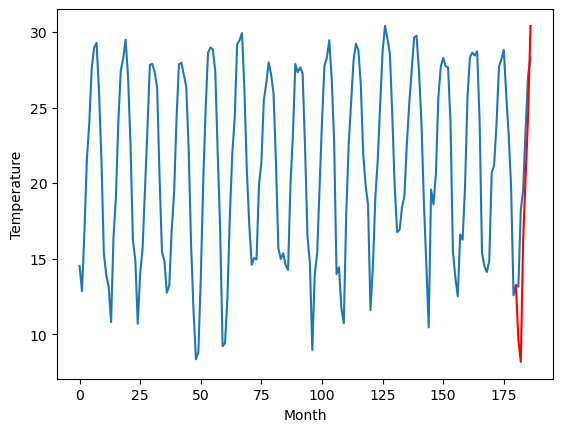

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
15.34		11.94		-3.40
16.20		10.47		-5.73
22.18		18.61		-3.57
23.82		22.76		-1.06
27.80		26.66		-1.14
31.94		32.70		0.76
[180, 181, 182, 183, 184, 185, 186]
[7.18, 11.939374704360961, 10.473624606132507, 18.608725924491882, 22.764871020317077, 26.664709706306457, 32.7025977563858]


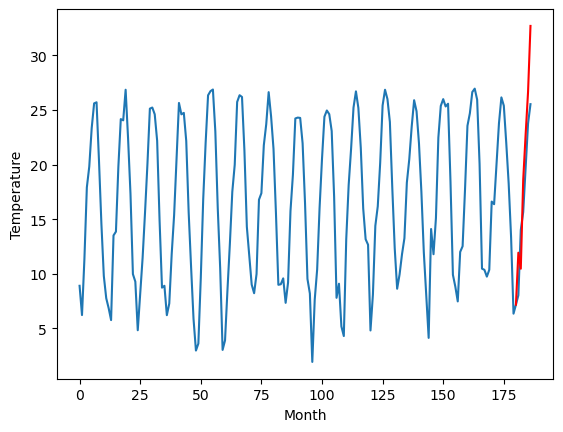

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.00		6.33		-2.67
7.43		4.86		-2.57
15.34		13.00		-2.34
17.13		17.15		0.02
21.10		21.05		-0.05
24.38		27.09		2.71
[180, 181, 182, 183, 184, 185, 186]
[11.46, 6.329374704360962, 4.8636246061325075, 12.998725924491882, 17.154871020317078, 21.054709706306458, 27.092597756385803]


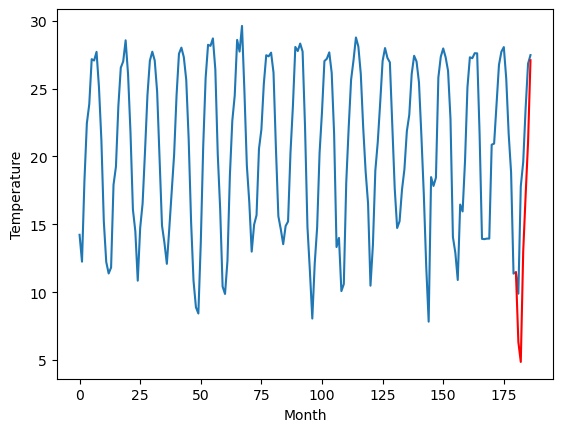

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		11.65		-1.70
10.26		10.18		-0.08
20.16		18.32		-1.84
22.09		22.47		0.38
25.95		26.37		0.42
31.15		32.41		1.26
[180, 181, 182, 183, 184, 185, 186]
[9.27, 11.649374704360962, 10.183624606132508, 18.318725924491883, 22.474871020317078, 26.374709706306458, 32.41259775638581]


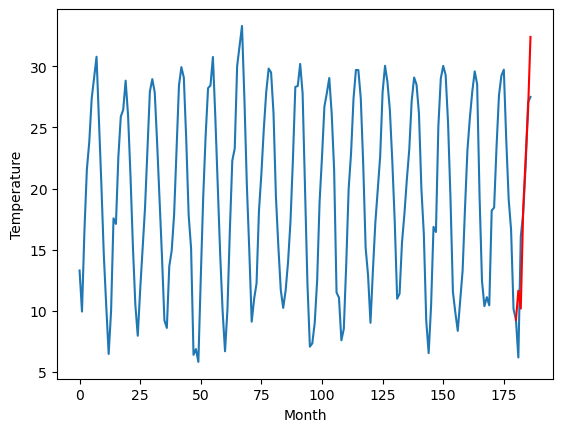

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.52		10.72		-0.80
12.17		9.25		-2.92
17.07		17.39		0.32
20.44		21.54		1.10
23.95		25.44		1.49
28.52		31.48		2.96
[180, 181, 182, 183, 184, 185, 186]
[7.77, 10.719374704360963, 9.253624606132508, 17.388725924491883, 21.54487102031708, 25.44470970630646, 31.482597756385804]


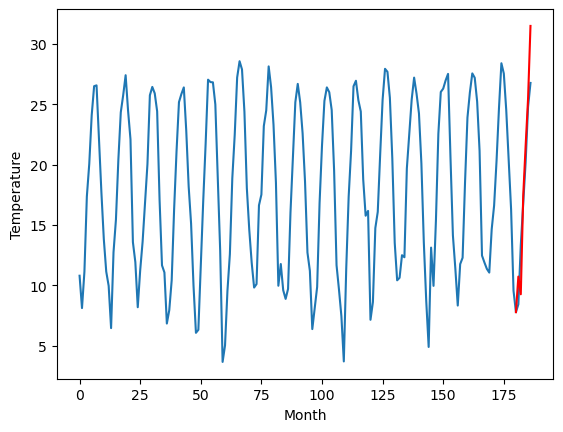

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.21		8.21		-2.00
10.85		6.74		-4.11
17.83		14.88		-2.95
18.86		19.03		0.17
22.57		22.93		0.36
26.90		28.97		2.07
[180, 181, 182, 183, 184, 185, 186]
[6.59, 8.209374704360961, 6.7436246061325065, 14.878725924491881, 19.034871020317077, 22.934709706306457, 28.972597756385802]


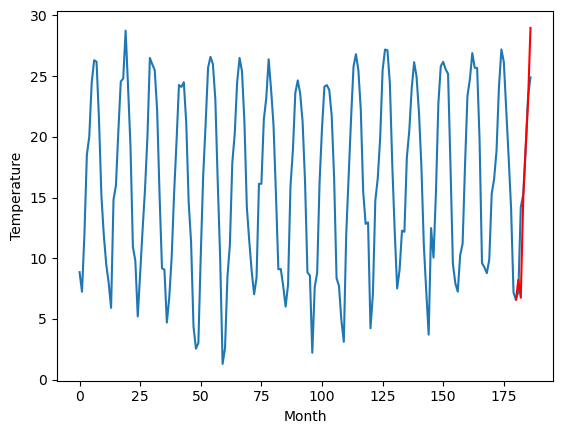

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.91		6.27		-1.64
8.53		4.80		-3.73
15.05		12.94		-2.11
18.68		17.09		-1.59
21.70		20.99		-0.71
26.49		27.03		0.54
[180, 181, 182, 183, 184, 185, 186]
[5.3, 6.269374704360962, 4.803624606132507, 12.938725924491882, 17.09487102031708, 20.99470970630646, 27.032597756385805]


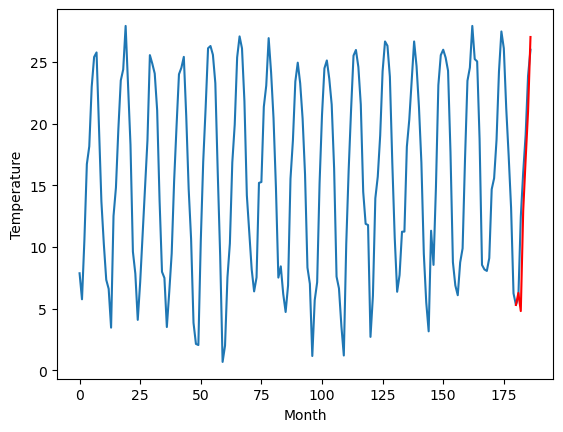

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.08		5.29		-1.79
2.81		3.82		1.01
15.28		11.96		-3.32
17.88		16.11		-1.77
22.57		20.01		-2.56
28.76		26.05		-2.71
[180, 181, 182, 183, 184, 185, 186]
[3.1, 5.289374704360962, 3.8236246061325074, 11.958725924491883, 16.11487102031708, 20.01470970630646, 26.052597756385804]


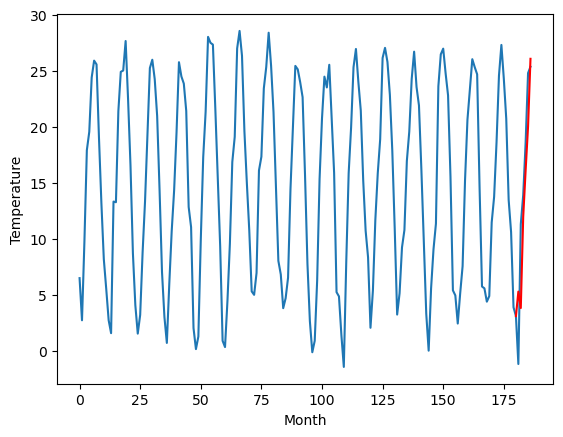

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
4.90		3.91		-0.99
2.73		2.44		-0.29
13.48		10.58		-2.90
16.54		14.73		-1.81
21.01		18.63		-2.38
27.49		24.67		-2.82
[180, 181, 182, 183, 184, 185, 186]
[0.6, 3.909374704360962, 2.4436246061325075, 10.578725924491883, 14.734871020317078, 18.63470970630646, 24.672597756385805]


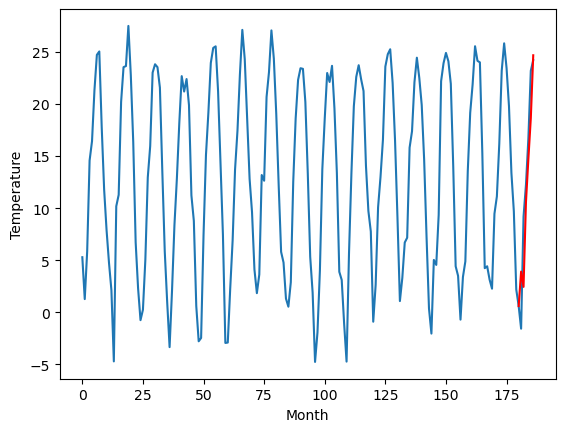

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
3.68		2.71		-0.97
-0.63		1.24		1.87
11.10		9.38		-1.72
15.07		13.53		-1.54
20.22		17.43		-2.79
27.53		23.47		-4.06
[180, 181, 182, 183, 184, 185, 186]
[-0.75, 2.709374704360962, 1.2436246061325074, 9.378725924491881, 13.534871020317077, 17.434709706306457, 23.472597756385802]


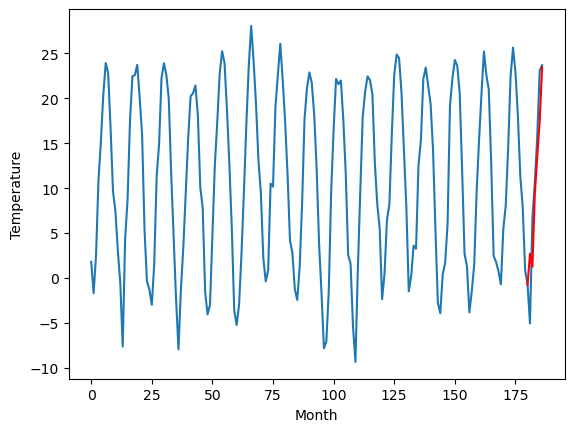

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.43   2.709375
1                 1   12.87   9.629375
2                 2   15.34  11.939375
3                 3    9.00   6.329375
4                 4   13.35  11.649375
5                 5   11.52  10.719375
6                 6   10.21   8.209375
7                 7    7.91   6.269375
8                 8    7.08   5.289375
9                 9    4.90   3.909375
10               10    3.68   2.709375


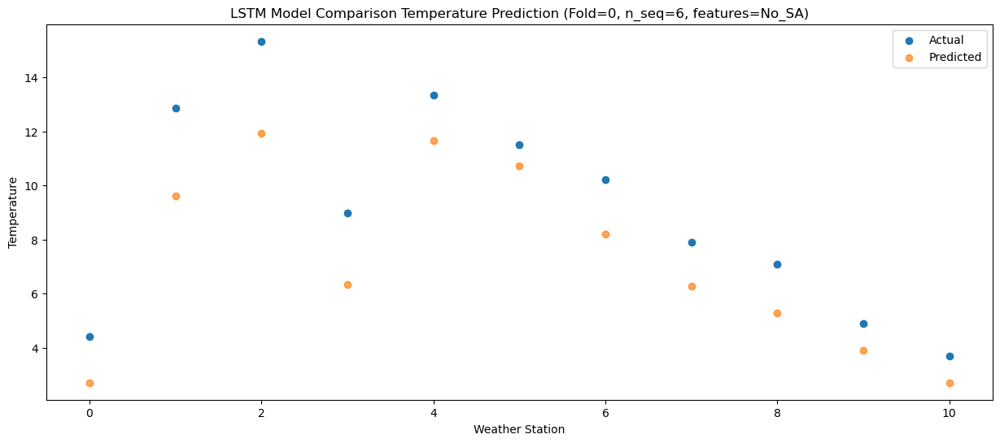

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.08   1.243625
1                 1   12.78   8.163625
2                 2   16.20  10.473625
3                 3    7.43   4.863625
4                 4   10.26  10.183625
5                 5   12.17   9.253625
6                 6   10.85   6.743625
7                 7    8.53   4.803625
8                 8    2.81   3.823625
9                 9    2.73   2.443625
10               10   -0.63   1.243625


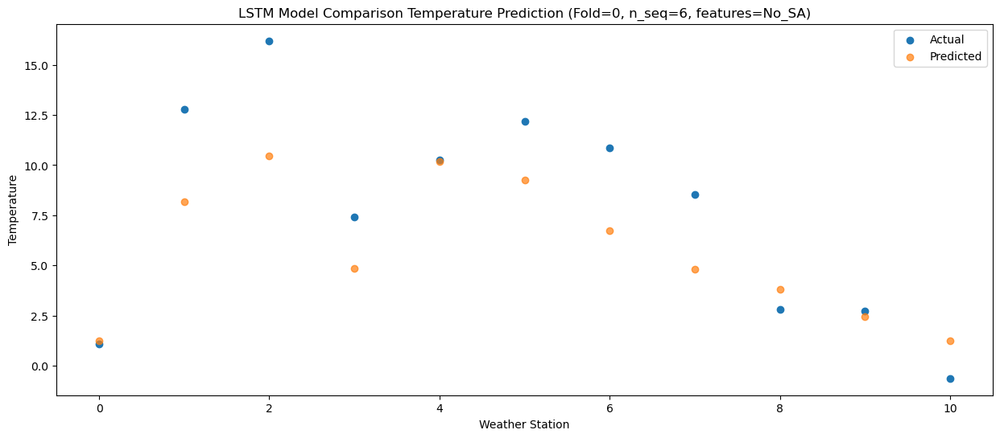

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   12.15   9.378726
1                 1   17.84  16.298726
2                 2   22.18  18.608726
3                 3   15.34  12.998726
4                 4   20.16  18.318726
5                 5   17.07  17.388726
6                 6   17.83  14.878726
7                 7   15.05  12.938726
8                 8   15.28  11.958726
9                 9   13.48  10.578726
10               10   11.10   9.378726


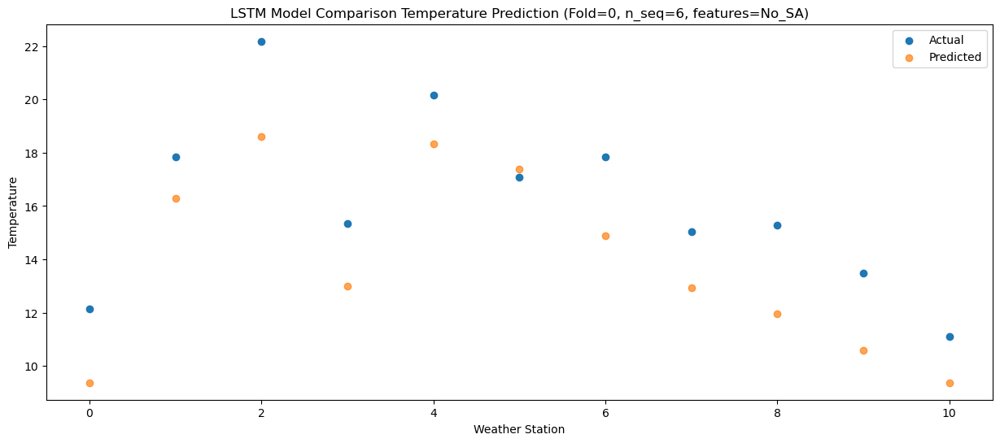

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   13.68  13.534871
1                 1   19.24  20.454871
2                 2   23.82  22.764871
3                 3   17.13  17.154871
4                 4   22.09  22.474871
5                 5   20.44  21.544871
6                 6   18.86  19.034871
7                 7   18.68  17.094871
8                 8   17.88  16.114871
9                 9   16.54  14.734871
10               10   15.07  13.534871


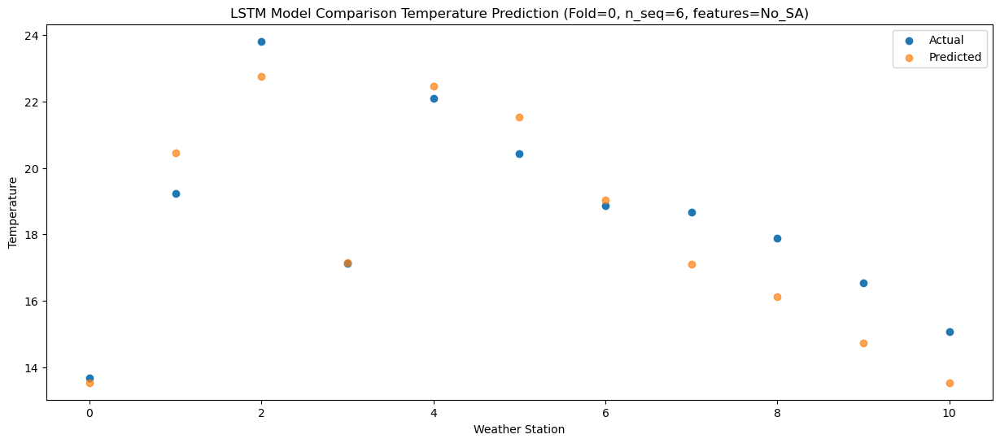

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   18.18   17.43471
1                 1   23.26   24.35471
2                 2   27.80   26.66471
3                 3   21.10   21.05471
4                 4   25.95   26.37471
5                 5   23.95   25.44471
6                 6   22.57   22.93471
7                 7   21.70   20.99471
8                 8   22.57   20.01471
9                 9   21.01   18.63471
10               10   20.22   17.43471


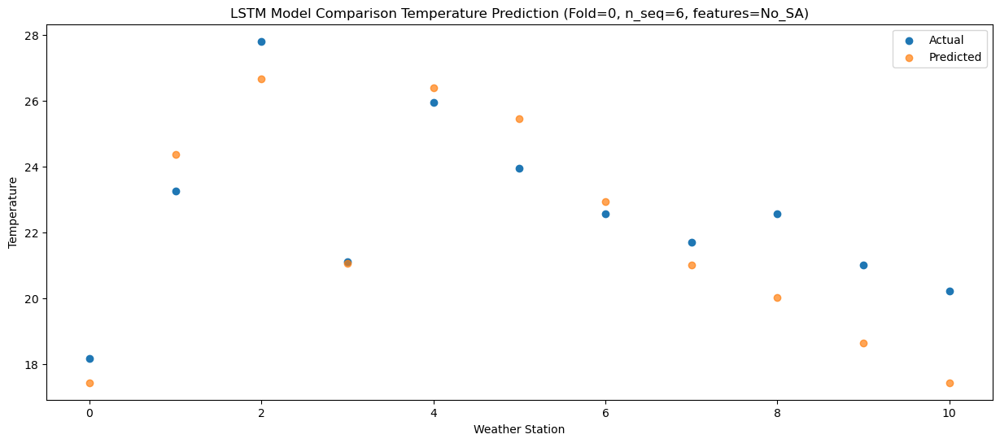

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   22.85  23.472598
1                 1   26.74  30.392598
2                 2   31.94  32.702598
3                 3   24.38  27.092598
4                 4   31.15  32.412598
5                 5   28.52  31.482598
6                 6   26.90  28.972598
7                 7   26.49  27.032598
8                 8   28.76  26.052598
9                 9   27.49  24.672598
10               10   27.53  23.472598


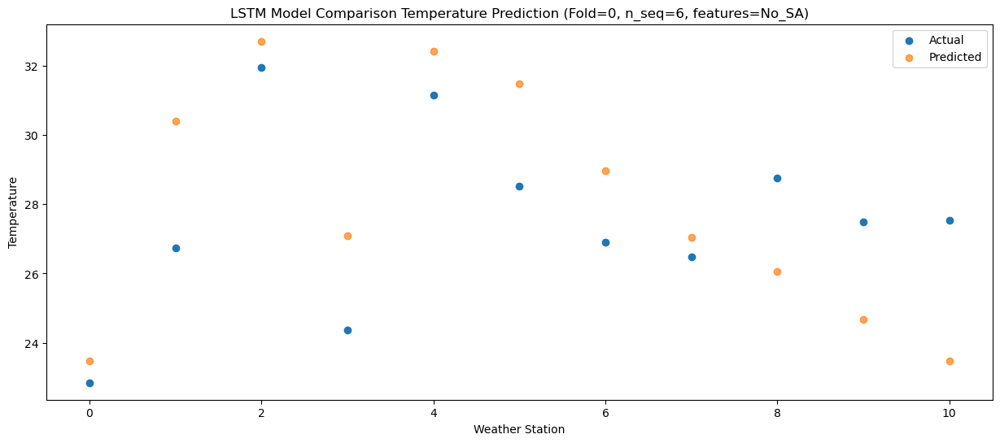

f, t:
[[ 4.43 12.87 15.34  9.   13.35 11.52 10.21  7.91  7.08  4.9   3.68]
 [ 1.08 12.78 16.2   7.43 10.26 12.17 10.85  8.53  2.81  2.73 -0.63]
 [12.15 17.84 22.18 15.34 20.16 17.07 17.83 15.05 15.28 13.48 11.1 ]
 [13.68 19.24 23.82 17.13 22.09 20.44 18.86 18.68 17.88 16.54 15.07]
 [18.18 23.26 27.8  21.1  25.95 23.95 22.57 21.7  22.57 21.01 20.22]
 [22.85 26.74 31.94 24.38 31.15 28.52 26.9  26.49 28.76 27.49 27.53]]
[[ 2.7093747   9.6293747  11.9393747   6.3293747  11.6493747  10.7193747
   8.2093747   6.2693747   5.2893747   3.9093747   2.7093747 ]
 [ 1.24362461  8.16362461 10.47362461  4.86362461 10.18362461  9.25362461
   6.74362461  4.80362461  3.82362461  2.44362461  1.24362461]
 [ 9.37872592 16.29872592 18.60872592 12.99872592 18.31872592 17.38872592
  14.87872592 12.93872592 11.95872592 10.57872592  9.37872592]
 [13.53487102 20.45487102 22.76487102 17.15487102 22.47487102 21.54487102
  19.03487102 17.09487102 16.11487102 14.73487102 13.53487102]
 [17.43470971 24.35470971 26.664

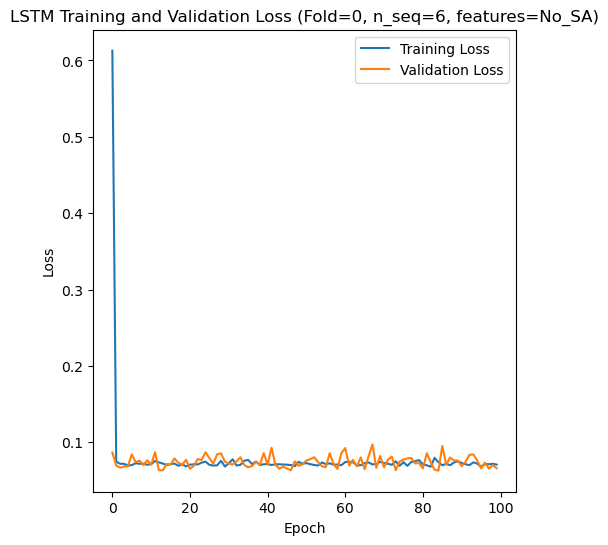

[[12.2  10.03 13.86 ... 24.46 19.58 17.03]
 [ 8.35  6.22 11.74 ... 22.47 18.02 13.98]
 [10.82  7.37 13.36 ... 24.57 19.57 16.15]
 ...
 [ 7.69  4.56 11.66 ... 25.3  19.83 13.28]
 [ 8.93  6.7  14.14 ... 25.37 21.51 12.55]
 [ 7.96  5.46 11.14 ... 25.13 20.28 10.63]]
Epoch 1/100
84/84 [==============================] - 38s 209ms/step - loss: 0.6140 - accuracy: 0.5119 - mae: 0.5604 - rmse: 0.6140 - mape: 96.6040 - pearson: 0.5812 - val_loss: 0.0814 - val_accuracy: 0.1000 - val_mae: 0.0637 - val_rmse: 0.0814 - val_mape: 11.0419 - val_pearson: 0.7826
Epoch 2/100
84/84 [==============================] - 13s 159ms/step - loss: 0.0773 - accuracy: 0.5952 - mae: 0.0622 - rmse: 0.0773 - mape: 10.9279 - pearson: 0.7704 - val_loss: 0.0736 - val_accuracy: 0.8000 - val_mae: 0.0616 - val_rmse: 0.0736 - val_mape: 10.7948 - val_pearson: 0.8231
Epoch 3/100
84/84 [==============================] - 15s 177ms/step - loss: 0.0784 - accuracy: 0.7500 - mae: 0.0637 - rmse: 0.0784 - mape: 11.2091 - pearson: 0.7741

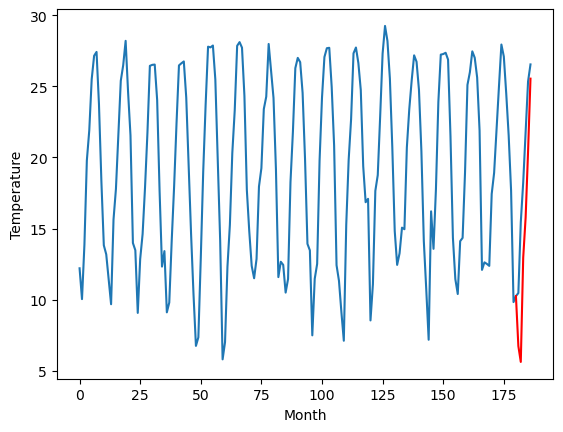

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.00		10.96		-1.04
12.66		9.85		-2.81
19.43		17.19		-2.24
21.57		20.02		-1.55
25.30		24.65		-0.65
29.44		29.79		0.35
[180, 181, 182, 183, 184, 185, 186]
[6.41, 10.96296830177307, 9.849569511413574, 17.18855209350586, 20.02215905189514, 24.65282530784607, 29.788734865188598]


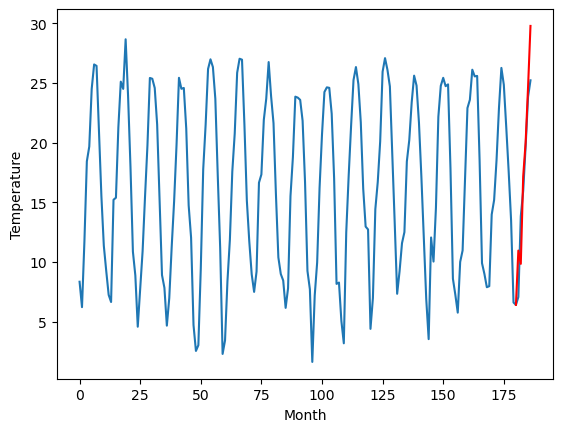

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.77		7.11		-1.66
9.26		6.00		-3.26
16.32		13.34		-2.98
17.72		16.17		-1.55
21.84		20.80		-1.04
25.72		25.94		0.22
[180, 181, 182, 183, 184, 185, 186]
[7.6, 7.112968301773071, 5.999569511413574, 13.338552093505859, 16.172159051895143, 20.80282530784607, 25.9387348651886]


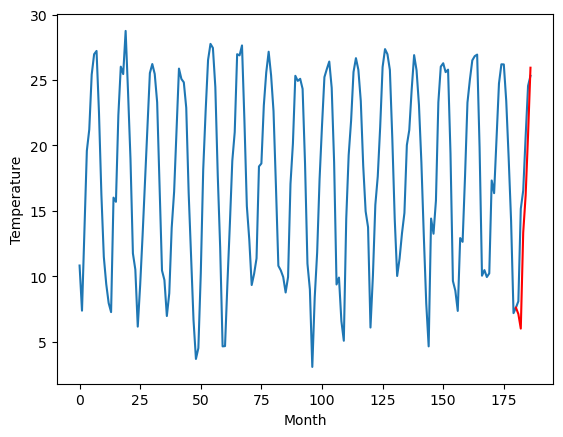

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.72		9.58		-1.14
9.13		8.47		-0.66
16.50		15.81		-0.69
18.84		18.64		-0.20
22.73		23.27		0.54
26.62		28.41		1.79
[180, 181, 182, 183, 184, 185, 186]
[11.89, 9.582968301773072, 8.469569511413575, 15.80855209350586, 18.642159051895142, 23.27282530784607, 28.4087348651886]


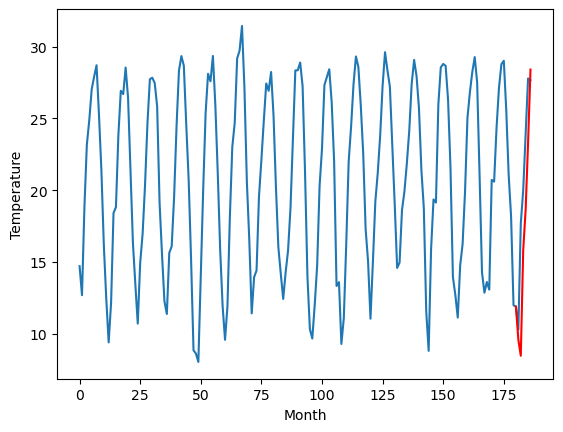

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.70		13.47		-1.23
13.00		12.36		-0.64
20.61		19.70		-0.91
22.91		22.53		-0.38
27.03		27.16		0.13
30.50		32.30		1.80
[180, 181, 182, 183, 184, 185, 186]
[10.96, 13.472968301773072, 12.359569511413575, 19.69855209350586, 22.532159051895142, 27.16282530784607, 32.2987348651886]


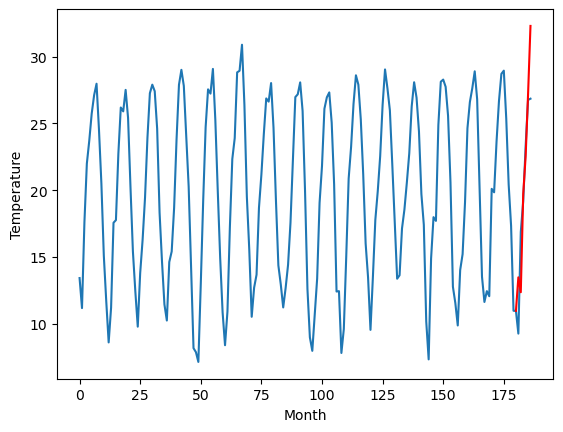

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.91		12.18		0.27
12.29		11.07		-1.22
19.63		18.41		-1.22
21.90		21.24		-0.66
27.49		25.87		-1.62
31.76		31.01		-0.75
[180, 181, 182, 183, 184, 185, 186]
[7.75, 12.182968301773071, 11.069569511413574, 18.40855209350586, 21.242159051895143, 25.87282530784607, 31.0087348651886]


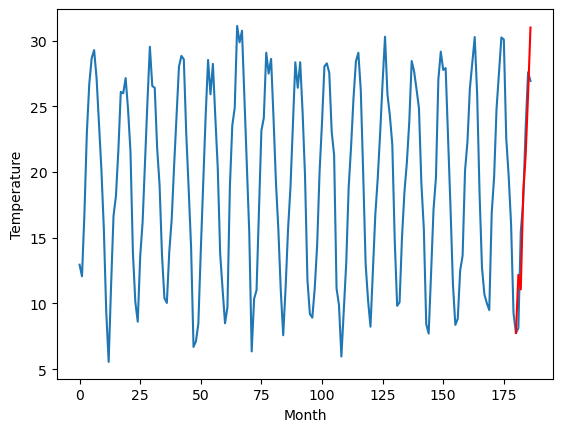

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.75		11.71		-1.04
13.53		10.60		-2.93
19.81		17.94		-1.87
22.38		20.77		-1.61
26.15		25.40		-0.75
30.16		30.54		0.38
[180, 181, 182, 183, 184, 185, 186]
[6.17, 11.71296830177307, 10.599569511413574, 17.93855209350586, 20.77215905189514, 25.40282530784607, 30.538734865188598]


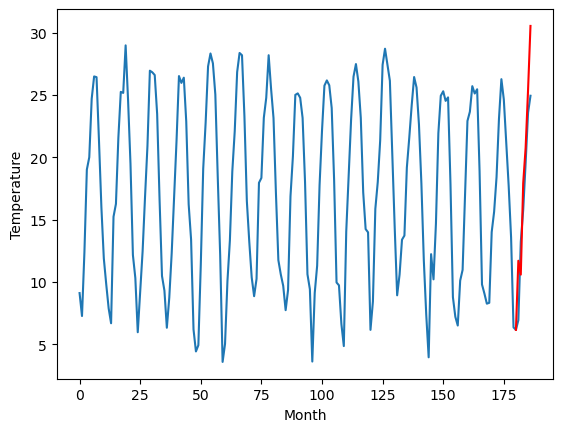

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.81		7.88		-0.93
5.81		6.77		0.96
17.13		14.11		-3.02
18.84		16.94		-1.90
23.50		21.57		-1.93
29.58		26.71		-2.87
[180, 181, 182, 183, 184, 185, 186]
[4.57, 7.8829683017730705, 6.769569511413573, 14.108552093505859, 16.94215905189514, 21.572825307846067, 26.708734865188596]


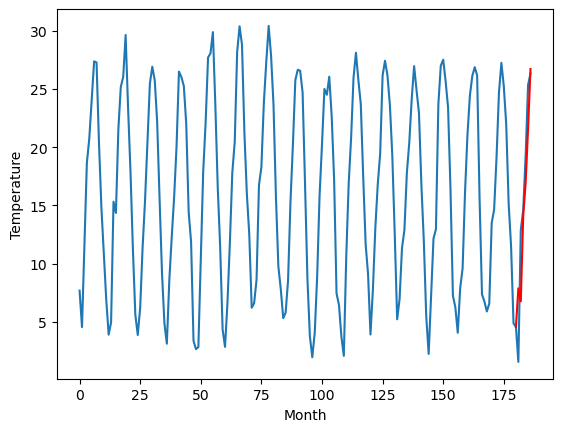

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.34		6.45		-0.89
2.56		5.34		2.78
15.12		12.68		-2.44
16.92		15.51		-1.41
21.73		20.14		-1.59
27.76		25.28		-2.48
[180, 181, 182, 183, 184, 185, 186]
[5.46, 6.452968301773072, 5.339569511413575, 12.67855209350586, 15.512159051895143, 20.14282530784607, 25.2787348651886]


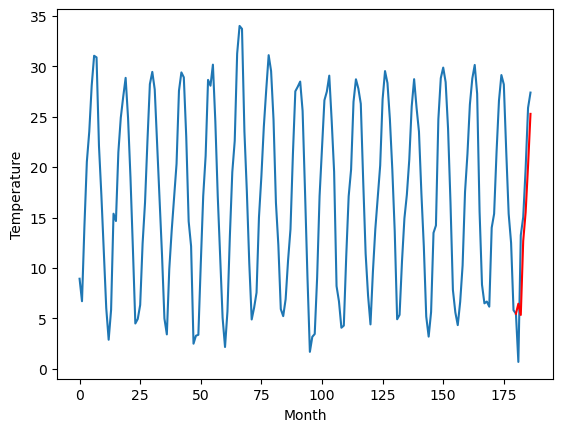

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.04		7.69		-1.35
4.67		6.58		1.91
15.38		13.92		-1.46
19.14		16.75		-2.39
23.69		21.38		-2.31
30.80		26.52		-4.28
[180, 181, 182, 183, 184, 185, 186]
[5.42, 7.692968301773071, 6.579569511413574, 13.918552093505859, 16.75215905189514, 21.38282530784607, 26.5187348651886]


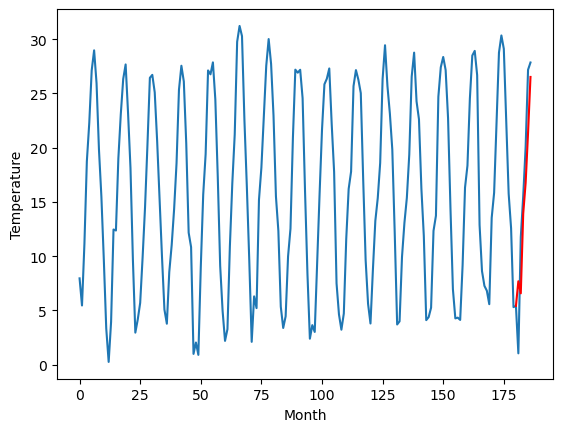

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.12		6.72		0.60
5.16		5.61		0.45
12.38		12.95		0.57
17.03		15.78		-1.25
21.57		20.41		-1.16
27.66		25.55		-2.11
[180, 181, 182, 183, 184, 185, 186]
[2.17, 6.722968301773071, 5.609569511413574, 12.94855209350586, 15.782159051895142, 20.41282530784607, 25.5487348651886]


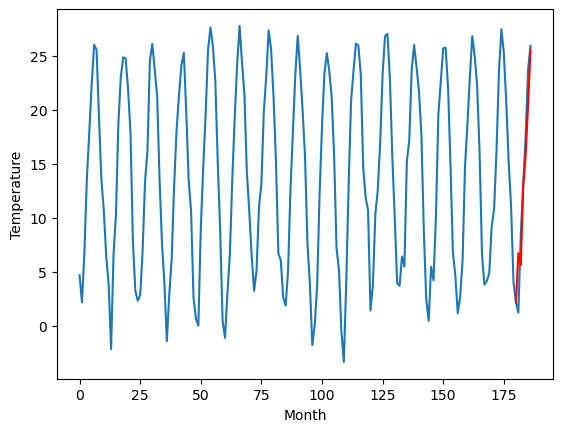

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    8.38   6.722968
1                 1   12.00  10.962968
2                 2    8.77   7.112968
3                 3   10.72   9.582968
4                 4   14.70  13.472968
5                 5   11.91  12.182968
6                 6   12.75  11.712968
7                 7    8.81   7.882968
8                 8    7.34   6.452968
9                 9    9.04   7.692968
10               10    6.12   6.722968


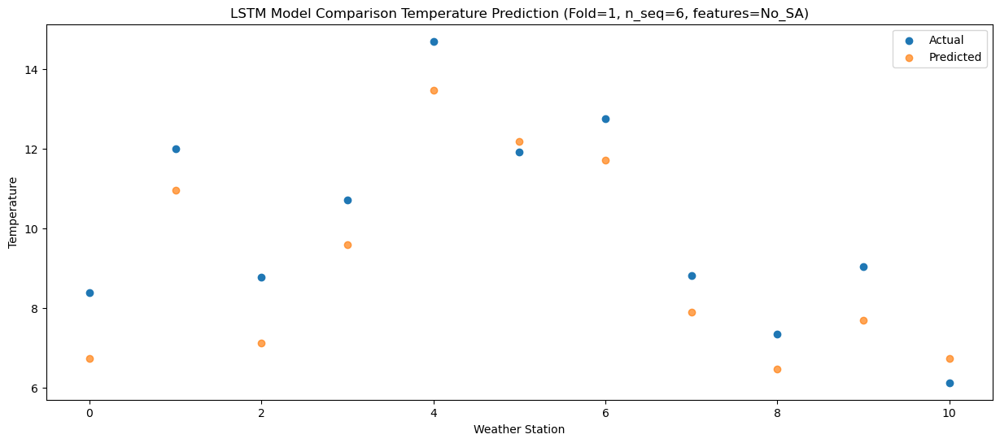

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    8.60    5.60957
1                 1   12.66    9.84957
2                 2    9.26    5.99957
3                 3    9.13    8.46957
4                 4   13.00   12.35957
5                 5   12.29   11.06957
6                 6   13.53   10.59957
7                 7    5.81    6.76957
8                 8    2.56    5.33957
9                 9    4.67    6.57957
10               10    5.16    5.60957


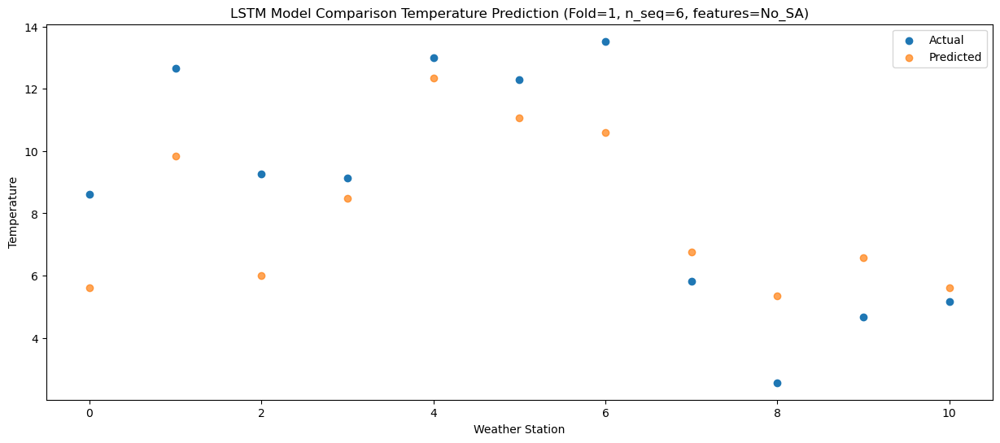

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   13.58  12.948552
1                 1   19.43  17.188552
2                 2   16.32  13.338552
3                 3   16.50  15.808552
4                 4   20.61  19.698552
5                 5   19.63  18.408552
6                 6   19.81  17.938552
7                 7   17.13  14.108552
8                 8   15.12  12.678552
9                 9   15.38  13.918552
10               10   12.38  12.948552


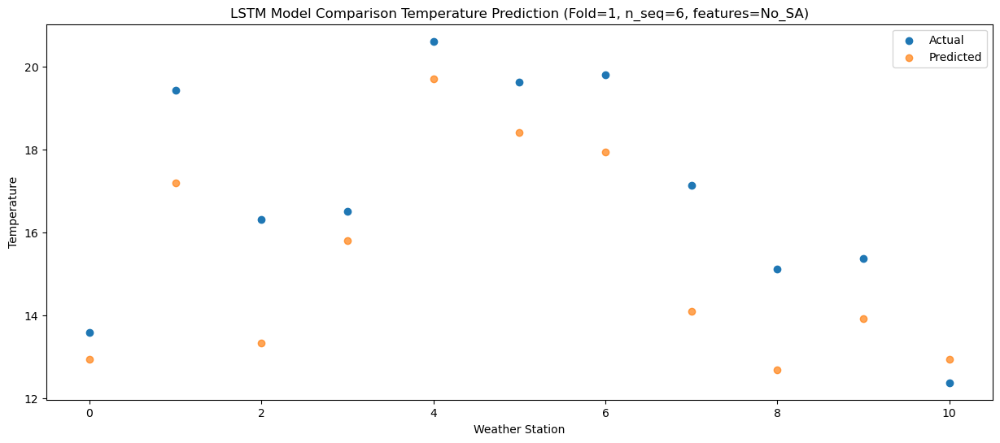

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   16.39  15.782159
1                 1   21.57  20.022159
2                 2   17.72  16.172159
3                 3   18.84  18.642159
4                 4   22.91  22.532159
5                 5   21.90  21.242159
6                 6   22.38  20.772159
7                 7   18.84  16.942159
8                 8   16.92  15.512159
9                 9   19.14  16.752159
10               10   17.03  15.782159


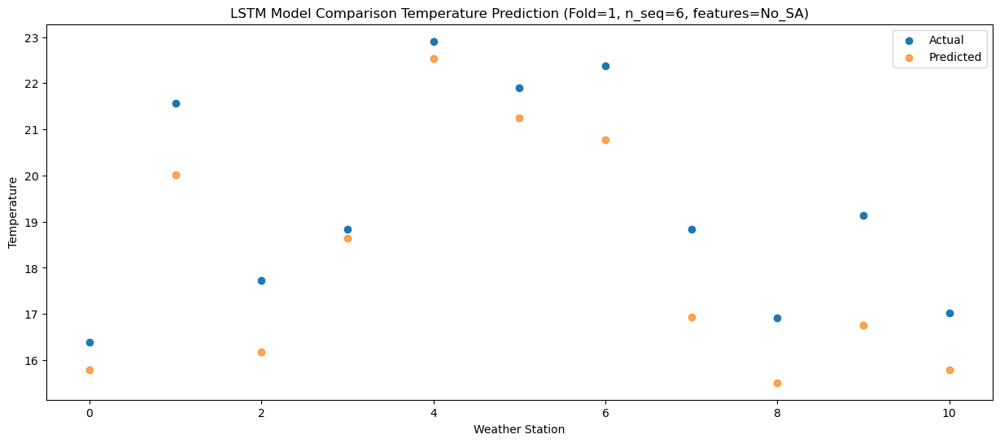

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   20.00  20.412825
1                 1   25.30  24.652825
2                 2   21.84  20.802825
3                 3   22.73  23.272825
4                 4   27.03  27.162825
5                 5   27.49  25.872825
6                 6   26.15  25.402825
7                 7   23.50  21.572825
8                 8   21.73  20.142825
9                 9   23.69  21.382825
10               10   21.57  20.412825


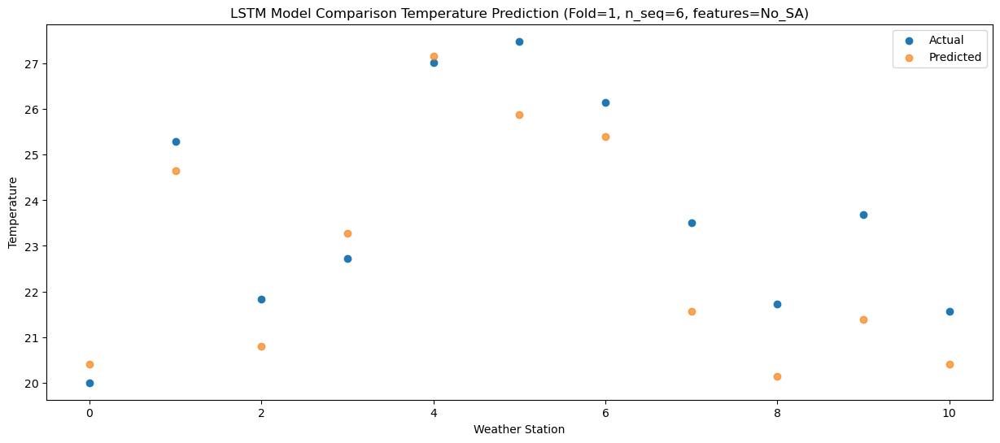

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   23.49  25.548735
1                 1   29.44  29.788735
2                 2   25.72  25.938735
3                 3   26.62  28.408735
4                 4   30.50  32.298735
5                 5   31.76  31.008735
6                 6   30.16  30.538735
7                 7   29.58  26.708735
8                 8   27.76  25.278735
9                 9   30.80  26.518735
10               10   27.66  25.548735


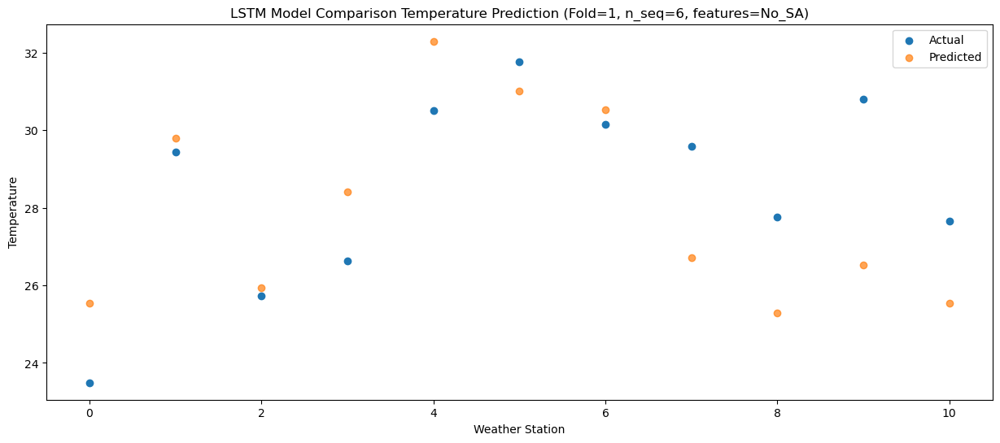

f, t:
[[ 8.38 12.    8.77 10.72 14.7  11.91 12.75  8.81  7.34  9.04  6.12]
 [ 8.6  12.66  9.26  9.13 13.   12.29 13.53  5.81  2.56  4.67  5.16]
 [13.58 19.43 16.32 16.5  20.61 19.63 19.81 17.13 15.12 15.38 12.38]
 [16.39 21.57 17.72 18.84 22.91 21.9  22.38 18.84 16.92 19.14 17.03]
 [20.   25.3  21.84 22.73 27.03 27.49 26.15 23.5  21.73 23.69 21.57]
 [23.49 29.44 25.72 26.62 30.5  31.76 30.16 29.58 27.76 30.8  27.66]]
[[ 6.7229683  10.9629683   7.1129683   9.5829683  13.4729683  12.1829683
  11.7129683   7.8829683   6.4529683   7.6929683   6.7229683 ]
 [ 5.60956951  9.84956951  5.99956951  8.46956951 12.35956951 11.06956951
  10.59956951  6.76956951  5.33956951  6.57956951  5.60956951]
 [12.94855209 17.18855209 13.33855209 15.80855209 19.69855209 18.40855209
  17.93855209 14.10855209 12.67855209 13.91855209 12.94855209]
 [15.78215905 20.02215905 16.17215905 18.64215905 22.53215905 21.24215905
  20.77215905 16.94215905 15.51215905 16.75215905 15.78215905]
 [20.41282531 24.65282531 20.802

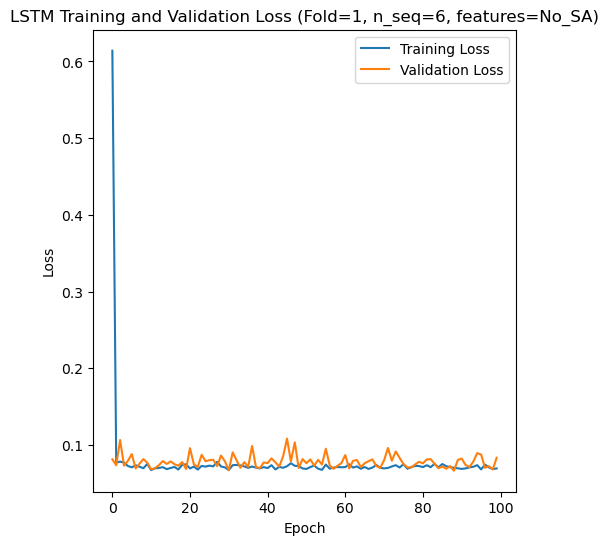

[[ 8.61  4.71 12.22 ... 22.49 18.22 13.52]
 [ 6.28  3.18  8.73 ... 22.36 17.39  7.52]
 [17.82 16.52 20.35 ... 28.79 25.32 22.93]
 ...
 [ 6.77  9.55 12.16 ... 24.55 20.29 10.24]
 [12.04 12.81 10.78 ... 23.32 20.33 13.93]
 [ 8.57  6.56 11.36 ... 21.36 16.14 12.65]]
Epoch 1/100
84/84 [==============================] - 46s 253ms/step - loss: 0.6328 - accuracy: 0.4524 - mae: 0.5624 - rmse: 0.6328 - mape: 98.8389 - pearson: 0.5602 - val_loss: 0.0757 - val_accuracy: 0.1000 - val_mae: 0.0552 - val_rmse: 0.0757 - val_mape: 9.0785 - val_pearson: 0.8335
Epoch 2/100
84/84 [==============================] - 15s 184ms/step - loss: 0.0769 - accuracy: 0.7500 - mae: 0.0615 - rmse: 0.0769 - mape: 10.7333 - pearson: 0.7943 - val_loss: 0.0434 - val_accuracy: 0.9000 - val_mae: 0.0349 - val_rmse: 0.0434 - val_mape: 5.7698 - val_pearson: 0.9173
Epoch 3/100
84/84 [==============================] - 17s 198ms/step - loss: 0.0748 - accuracy: 0.7381 - mae: 0.0608 - rmse: 0.0748 - mape: 10.6408 - pearson: 0.7868 -

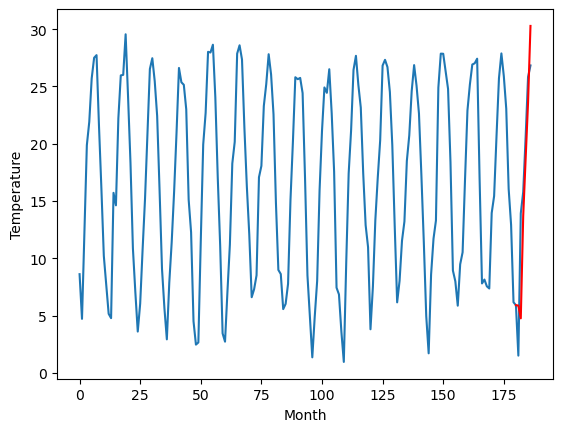

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.53		5.91		-2.62
4.49		4.79		0.30
14.68		13.73		-0.95
18.44		18.74		0.30
23.62		23.65		0.03
30.87		30.32		-0.55
[180, 181, 182, 183, 184, 185, 186]
[2.63, 5.912760124206542, 4.7941244697570795, 13.733322963714599, 18.73584066390991, 23.64854513168335, 30.320165977478027]


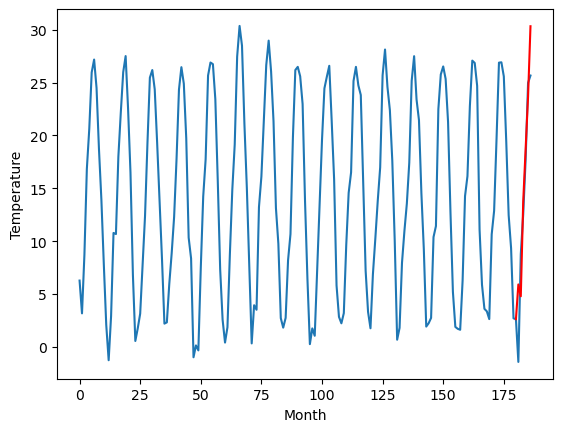

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.94		3.58		-3.36
9.67		2.46		-7.21
11.48		11.40		-0.08
13.29		16.41		3.12
16.87		21.32		4.45
18.09		27.99		9.90
[180, 181, 182, 183, 184, 185, 186]
[16.55, 3.582760124206543, 2.4641244697570803, 11.4033229637146, 16.405840663909913, 21.31854513168335, 27.99016597747803]


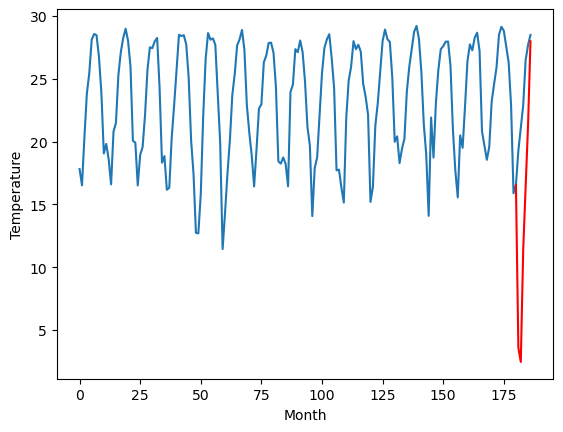

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.74		15.12		0.38
14.76		14.00		-0.76
18.87		22.94		4.07
23.37		27.95		4.58
28.63		32.86		4.23
34.20		39.53		5.33
[180, 181, 182, 183, 184, 185, 186]
[-0.83, 15.122760124206543, 14.00412446975708, 22.9433229637146, 27.945840663909912, 32.85854513168335, 39.53016597747803]


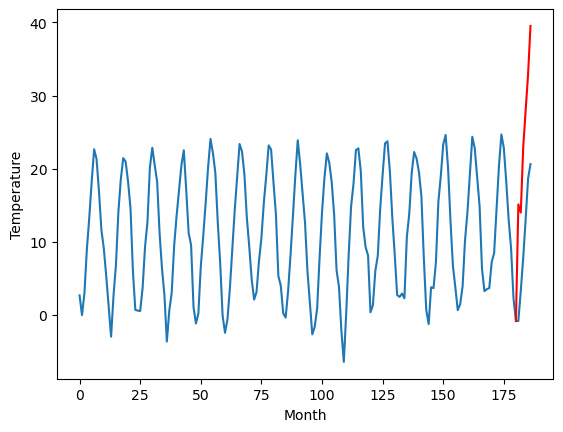

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
3.03		-0.02		-3.05
2.29		-1.14		-3.43
9.62		7.80		-1.82
10.49		12.81		2.32
14.96		17.72		2.76
18.44		24.39		5.95
[180, 181, 182, 183, 184, 185, 186]
[11.52, -0.01723987579345687, -1.1358755302429198, 7.803322963714599, 12.805840663909912, 17.71854513168335, 24.390165977478027]


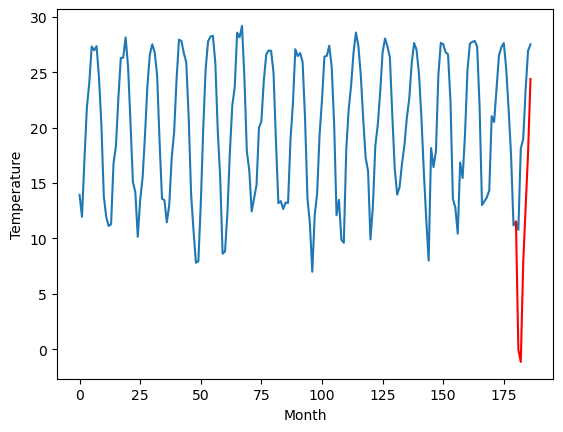

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		11.24		-2.11
11.00		10.12		-0.88
19.38		19.06		-0.32
21.50		24.07		2.57
25.54		28.98		3.44
30.09		35.65		5.56
[180, 181, 182, 183, 184, 185, 186]
[11.47, 11.242760124206542, 10.12412446975708, 19.063322963714597, 24.06584066390991, 28.978545131683347, 35.650165977478025]


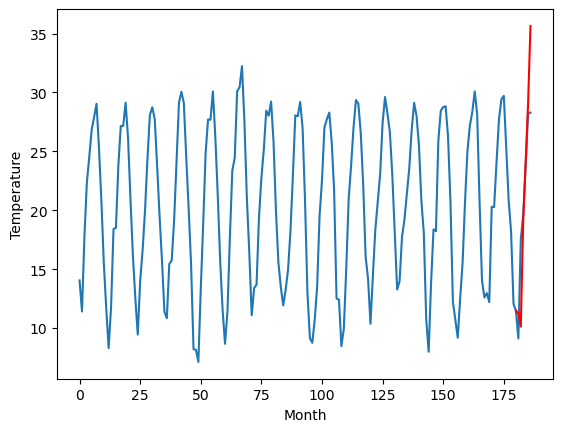

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		11.35		-2.00
10.24		10.23		-0.01
20.61		19.17		-1.44
22.31		24.18		1.87
26.39		29.09		2.70
31.95		35.76		3.81
[180, 181, 182, 183, 184, 185, 186]
[7.75, 11.352760124206544, 10.23412446975708, 19.1733229637146, 24.175840663909913, 29.08854513168335, 35.760165977478025]


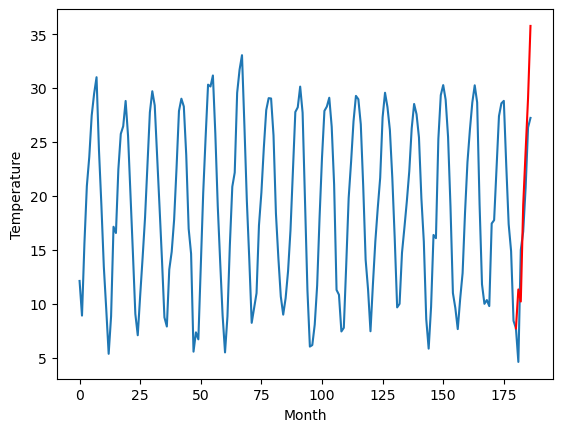

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.68		9.44		-3.24
15.60		8.32		-7.28
18.70		17.26		-1.44
25.36		22.27		-3.09
30.37		27.18		-3.19
35.36		33.85		-1.51
[180, 181, 182, 183, 184, 185, 186]
[4.9, 9.442760124206544, 8.32412446975708, 17.2633229637146, 22.265840663909913, 27.17854513168335, 33.85016597747803]


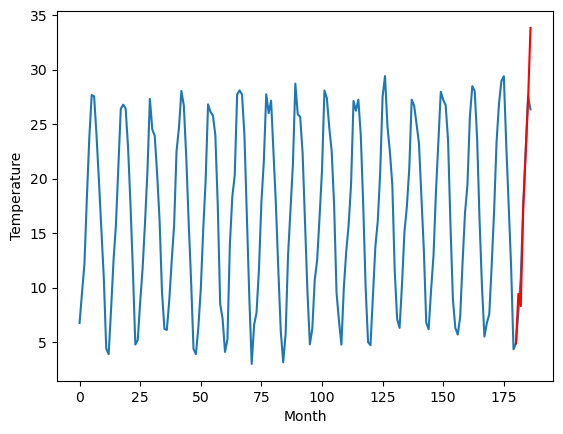

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.71		4.07		-2.64
5.79		2.95		-2.84
5.39		11.89		6.50
9.25		16.90		7.65
11.47		21.81		10.34
15.71		28.48		12.77
[180, 181, 182, 183, 184, 185, 186]
[14.14, 4.0727601242065425, 2.9541244697570797, 11.8933229637146, 16.89584066390991, 21.80854513168335, 28.480165977478027]


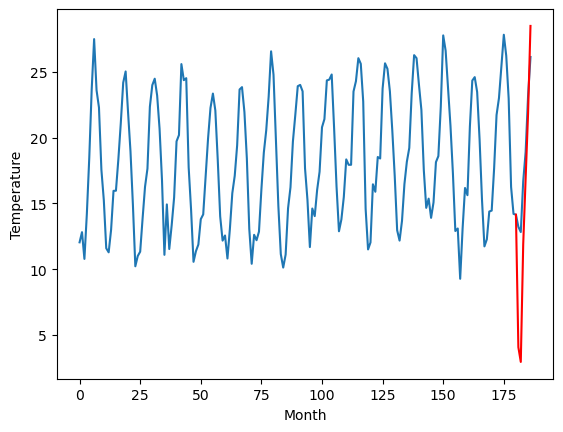

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.63		9.34		-2.29
12.13		8.22		-3.91
19.01		17.16		-1.85
21.80		22.17		0.37
25.82		27.08		1.26
30.11		33.75		3.64
[180, 181, 182, 183, 184, 185, 186]
[5.55, 9.342760124206542, 8.22412446975708, 17.1633229637146, 22.16584066390991, 27.07854513168335, 33.75016597747803]


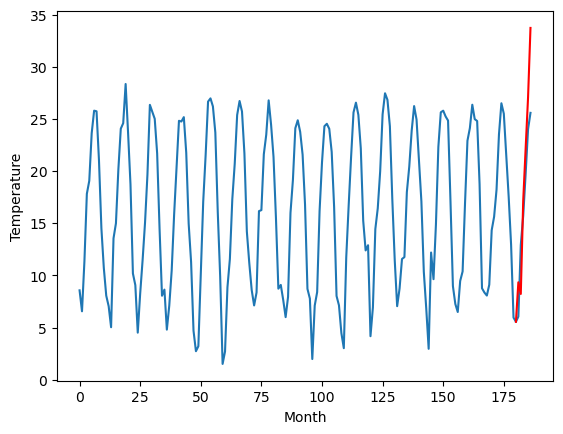

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.90		5.87		-3.03
10.25		4.75		-5.50
16.46		13.69		-2.77
18.43		18.70		0.27
23.34		23.61		0.27
28.75		30.28		1.53
[180, 181, 182, 183, 184, 185, 186]
[3.19, 5.872760124206543, 4.75412446975708, 13.6933229637146, 18.695840663909912, 23.60854513168335, 30.280165977478028]


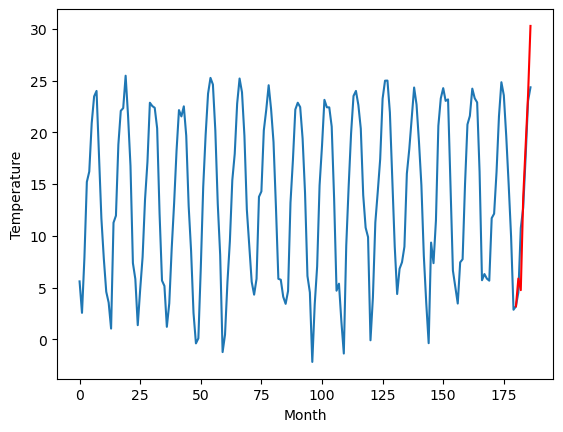

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    8.31    5.87276
1                 1    8.53    5.91276
2                 2    6.94    3.58276
3                 3   14.74   15.12276
4                 4    3.03   -0.01724
5                 5   13.35   11.24276
6                 6   13.35   11.35276
7                 7   12.68    9.44276
8                 8    6.71    4.07276
9                 9   11.63    9.34276
10               10    8.90    5.87276


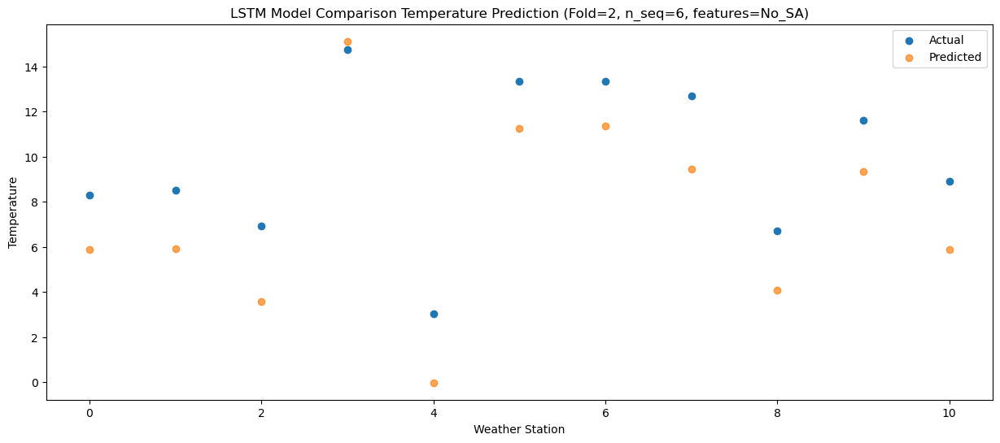

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.91   4.754124
1                 1    4.49   4.794124
2                 2    9.67   2.464124
3                 3   14.76  14.004124
4                 4    2.29  -1.135876
5                 5   11.00  10.124124
6                 6   10.24  10.234124
7                 7   15.60   8.324124
8                 8    5.79   2.954124
9                 9   12.13   8.224124
10               10   10.25   4.754124


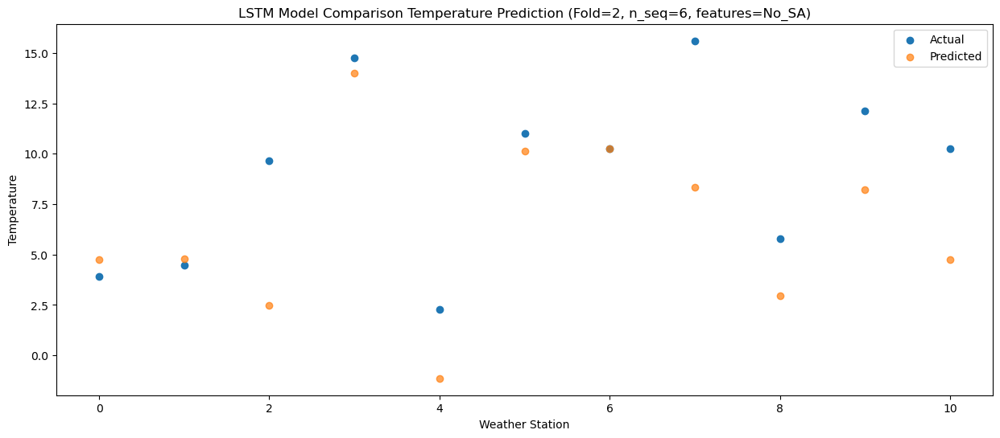

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   16.33  13.693323
1                 1   14.68  13.733323
2                 2   11.48  11.403323
3                 3   18.87  22.943323
4                 4    9.62   7.803323
5                 5   19.38  19.063323
6                 6   20.61  19.173323
7                 7   18.70  17.263323
8                 8    5.39  11.893323
9                 9   19.01  17.163323
10               10   16.46  13.693323


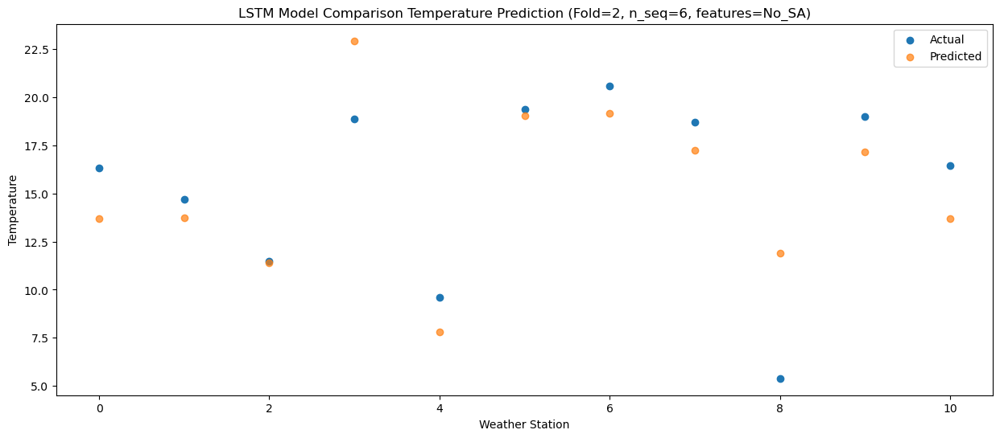

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   18.20  18.695841
1                 1   18.44  18.735841
2                 2   13.29  16.405841
3                 3   23.37  27.945841
4                 4   10.49  12.805841
5                 5   21.50  24.065841
6                 6   22.31  24.175841
7                 7   25.36  22.265841
8                 8    9.25  16.895841
9                 9   21.80  22.165841
10               10   18.43  18.695841


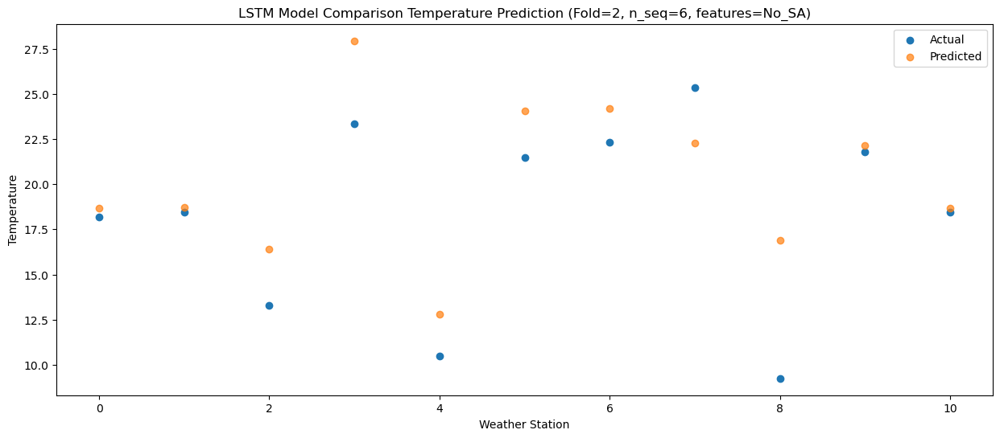

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   22.98  23.608545
1                 1   23.62  23.648545
2                 2   16.87  21.318545
3                 3   28.63  32.858545
4                 4   14.96  17.718545
5                 5   25.54  28.978545
6                 6   26.39  29.088545
7                 7   30.37  27.178545
8                 8   11.47  21.808545
9                 9   25.82  27.078545
10               10   23.34  23.608545


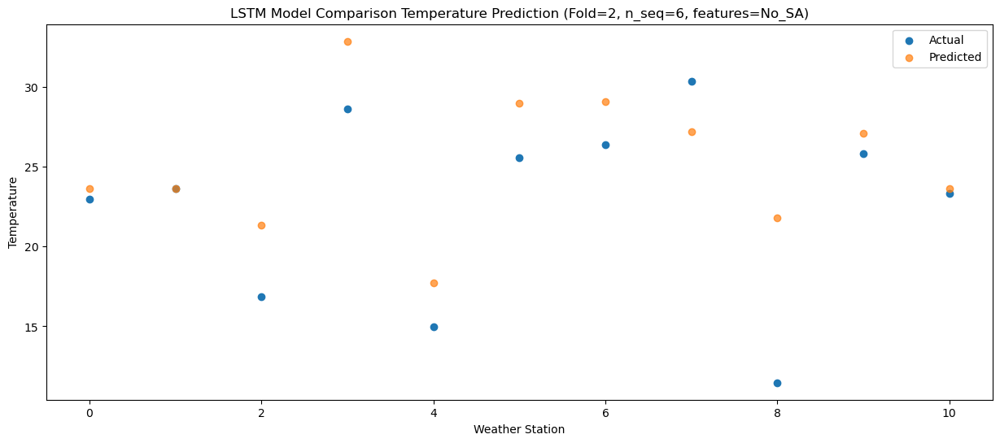

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   28.23  30.280166
1                 1   30.87  30.320166
2                 2   18.09  27.990166
3                 3   34.20  39.530166
4                 4   18.44  24.390166
5                 5   30.09  35.650166
6                 6   31.95  35.760166
7                 7   35.36  33.850166
8                 8   15.71  28.480166
9                 9   30.11  33.750166
10               10   28.75  30.280166


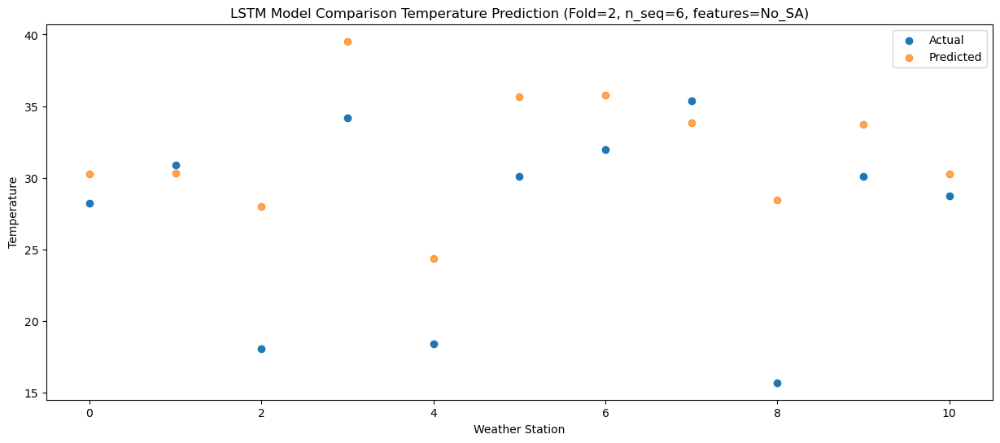

f, t:
[[ 8.31  8.53  6.94 14.74  3.03 13.35 13.35 12.68  6.71 11.63  8.9 ]
 [ 3.91  4.49  9.67 14.76  2.29 11.   10.24 15.6   5.79 12.13 10.25]
 [16.33 14.68 11.48 18.87  9.62 19.38 20.61 18.7   5.39 19.01 16.46]
 [18.2  18.44 13.29 23.37 10.49 21.5  22.31 25.36  9.25 21.8  18.43]
 [22.98 23.62 16.87 28.63 14.96 25.54 26.39 30.37 11.47 25.82 23.34]
 [28.23 30.87 18.09 34.2  18.44 30.09 31.95 35.36 15.71 30.11 28.75]]
[[ 5.87276012e+00  5.91276012e+00  3.58276012e+00  1.51227601e+01
  -1.72398758e-02  1.12427601e+01  1.13527601e+01  9.44276012e+00
   4.07276012e+00  9.34276012e+00  5.87276012e+00]
 [ 4.75412447e+00  4.79412447e+00  2.46412447e+00  1.40041245e+01
  -1.13587553e+00  1.01241245e+01  1.02341245e+01  8.32412447e+00
   2.95412447e+00  8.22412447e+00  4.75412447e+00]
 [ 1.36933230e+01  1.37333230e+01  1.14033230e+01  2.29433230e+01
   7.80332296e+00  1.90633230e+01  1.91733230e+01  1.72633230e+01
   1.18933230e+01  1.71633230e+01  1.36933230e+01]
 [ 1.86958407e+01  1.87358407e

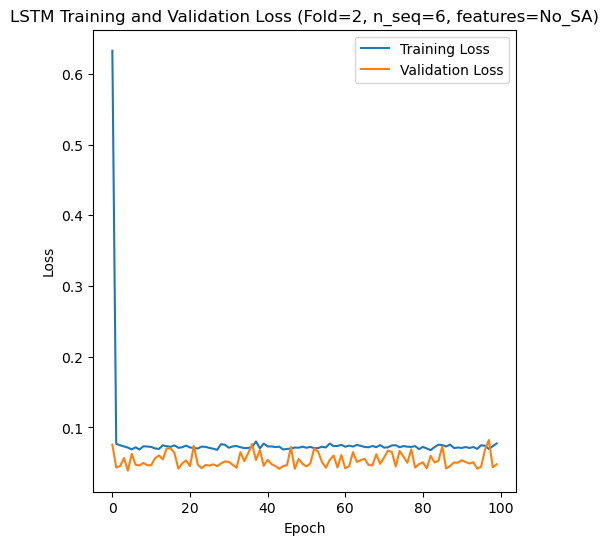

[[ 8.9   6.89 11.3  ... 22.19 16.88 13.54]
 [ 7.02  3.15 10.24 ... 22.31 18.92 11.32]
 [ 7.65  9.7   9.44 ... 25.68 20.65 11.46]
 ...
 [ 9.57 11.93 12.22 ... 30.9  25.01 12.37]
 [ 9.04  9.3   8.59 ... 17.72 17.26 10.73]
 [ 3.2   0.4   3.78 ... 18.92 14.39 10.04]]
Epoch 1/100
84/84 [==============================] - 53s 303ms/step - loss: 0.5674 - accuracy: 0.6429 - mae: 0.5175 - rmse: 0.5674 - mape: 94.3298 - pearson: 0.6738 - val_loss: 0.0999 - val_accuracy: 0.1000 - val_mae: 0.0770 - val_rmse: 0.0999 - val_mape: 14.2444 - val_pearson: 0.6924
Epoch 2/100
84/84 [==============================] - 18s 211ms/step - loss: 0.0798 - accuracy: 0.7619 - mae: 0.0636 - rmse: 0.0798 - mape: 11.6864 - pearson: 0.8141 - val_loss: 0.0837 - val_accuracy: 0.7000 - val_mae: 0.0649 - val_rmse: 0.0837 - val_mape: 13.5091 - val_pearson: 0.7794
Epoch 3/100
84/84 [==============================] - 17s 204ms/step - loss: 0.0700 - accuracy: 0.7500 - mae: 0.0569 - rmse: 0.0700 - mape: 10.3758 - pearson: 0.8252

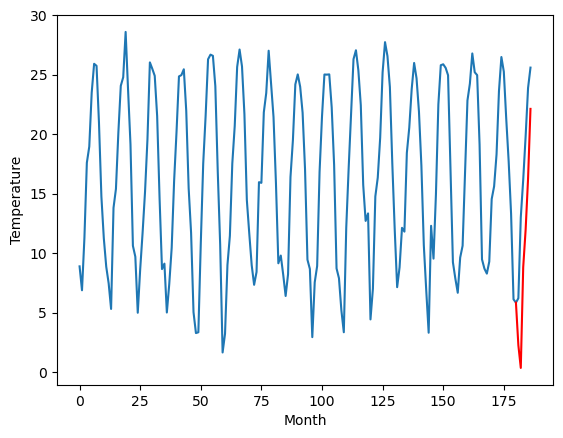

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.75		7.97		0.22
4.03		6.06		2.03
16.00		14.53		-1.47
17.86		17.69		-0.17
22.08		21.97		-0.11
28.79		27.84		-0.95
[180, 181, 182, 183, 184, 185, 186]
[3.2, 7.971752429008484, 6.061965966224671, 14.526389145851136, 17.689522528648375, 21.97137906551361, 27.84051969051361]


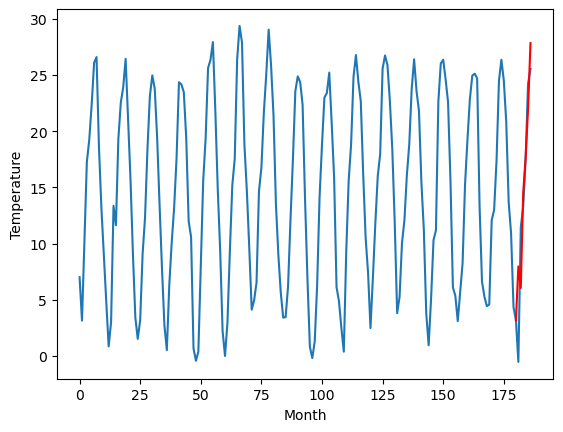

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.28		6.09		-2.19
10.58		4.18		-6.40
11.73		12.65		0.92
17.46		15.81		-1.65
22.26		20.09		-2.17
27.11		25.96		-1.15
[180, 181, 182, 183, 184, 185, 186]
[8.48, 6.0917524290084835, 4.18196596622467, 12.646389145851135, 15.809522528648376, 20.09137906551361, 25.96051969051361]


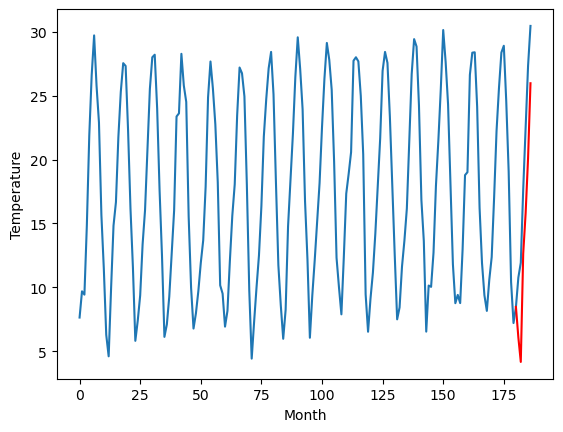

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.19		6.72		0.53
4.87		4.81		-0.06
15.08		13.28		-1.80
17.43		16.44		-0.99
21.50		20.72		-0.78
27.42		26.59		-0.83
[180, 181, 182, 183, 184, 185, 186]
[1.55, 6.721752429008484, 4.811965966224671, 13.276389145851136, 16.439522528648375, 20.72137906551361, 26.59051969051361]


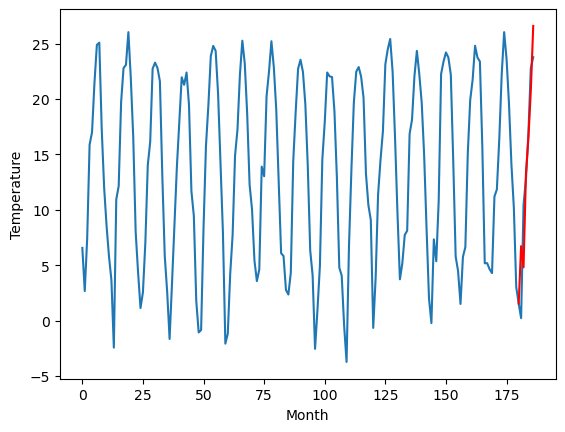

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.10		5.64		0.54
1.23		3.73		2.50
14.31		12.20		-2.11
17.60		15.36		-2.24
22.17		19.64		-2.53
29.65		25.51		-4.14
[180, 181, 182, 183, 184, 185, 186]
[1.08, 5.641752429008484, 3.7319659662246707, 12.196389145851136, 15.359522528648377, 19.64137906551361, 25.51051969051361]


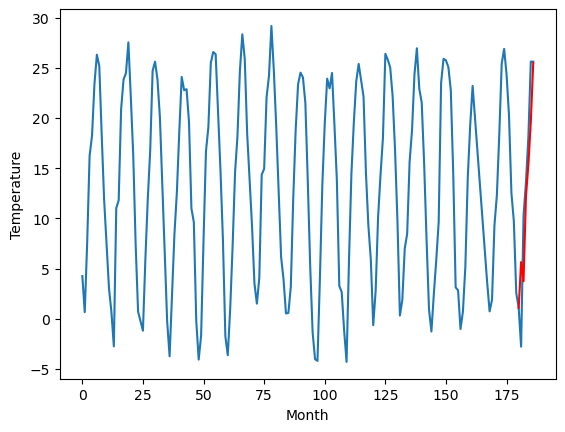

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.80		3.32		0.52
0.08		1.41		1.33
11.41		9.88		-1.53
14.86		13.04		-1.82
19.14		17.32		-1.82
25.85		23.19		-2.66
[180, 181, 182, 183, 184, 185, 186]
[0.21, 3.321752429008484, 1.4119659662246704, 9.876389145851135, 13.039522528648376, 17.32137906551361, 23.19051969051361]


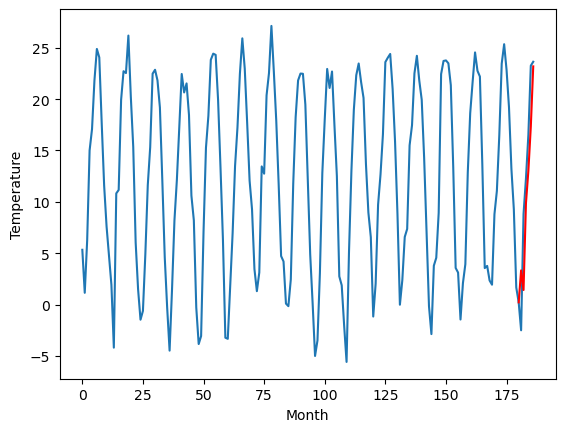

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.60		4.40		-1.20
5.70		2.49		-3.21
8.67		10.96		2.29
13.45		14.12		0.67
18.50		18.40		-0.10
25.89		24.27		-1.62
[180, 181, 182, 183, 184, 185, 186]
[-8.22, 4.401752429008484, 2.4919659662246705, 10.956389145851135, 14.119522528648377, 18.40137906551361, 24.27051969051361]


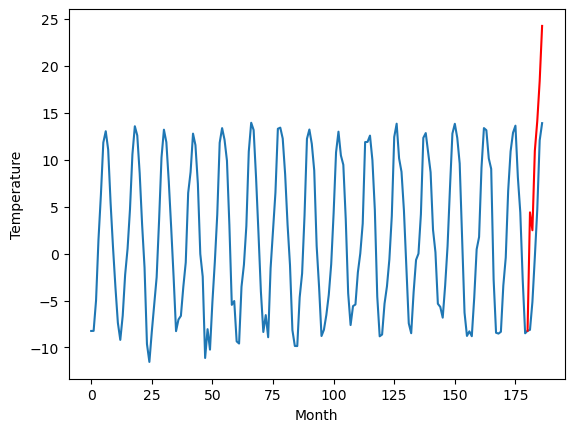

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
-7.69		-9.17		-1.48
-4.84		-11.08		-6.24
-3.24		-2.61		0.63
4.73		0.55		-4.18
9.16		4.83		-4.33
16.80		10.70		-6.10
[180, 181, 182, 183, 184, 185, 186]
[10.04, -9.168247570991516, -11.07803403377533, -2.613610854148865, 0.5495225286483763, 4.831379065513611, 10.70051969051361]


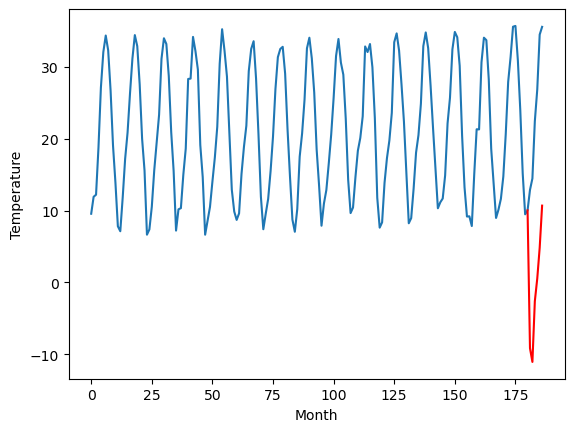

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.79		8.64		-2.15
11.72		6.73		-4.99
11.50		15.20		3.70
13.69		18.36		4.67
17.98		22.64		4.66
19.68		28.51		8.83
[180, 181, 182, 183, 184, 185, 186]
[9.17, 8.641752429008484, 6.731965966224671, 15.196389145851136, 18.359522528648377, 22.64137906551361, 28.51051969051361]


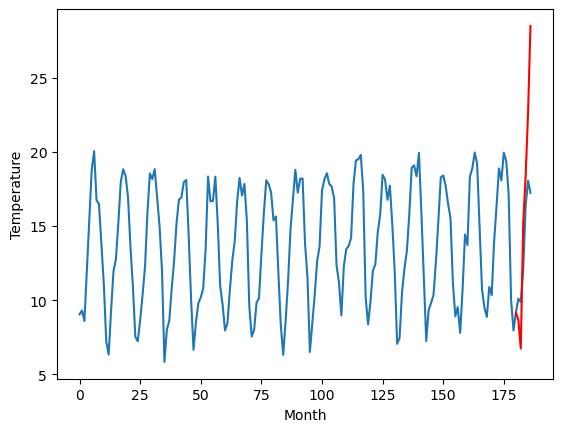

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.02		8.11		2.09
5.90		6.20		0.30
10.90		14.67		3.77
15.52		17.83		2.31
20.35		22.11		1.76
26.22		27.98		1.76
[180, 181, 182, 183, 184, 185, 186]
[0.94, 8.111752429008483, 6.20196596622467, 14.666389145851134, 17.829522528648376, 22.11137906551361, 27.98051969051361]


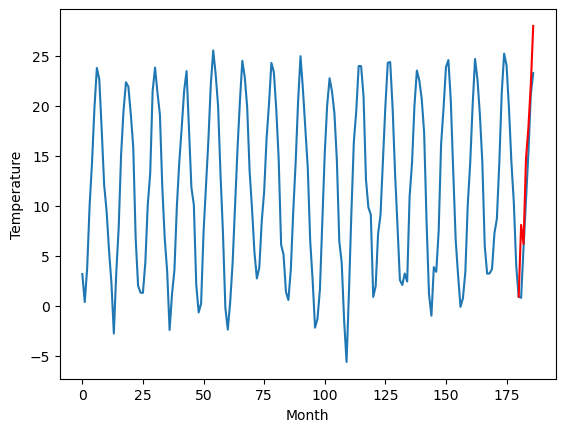

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
1.64		2.27		0.63
0.84		0.36		-0.48
8.03		8.83		0.80
12.90		11.99		-0.91
17.16		16.27		-0.89
23.33		22.14		-1.19
[180, 181, 182, 183, 184, 185, 186]
[-0.13, 2.271752429008484, 0.3619659662246706, 8.826389145851135, 11.989522528648376, 16.27137906551361, 22.14051969051361]


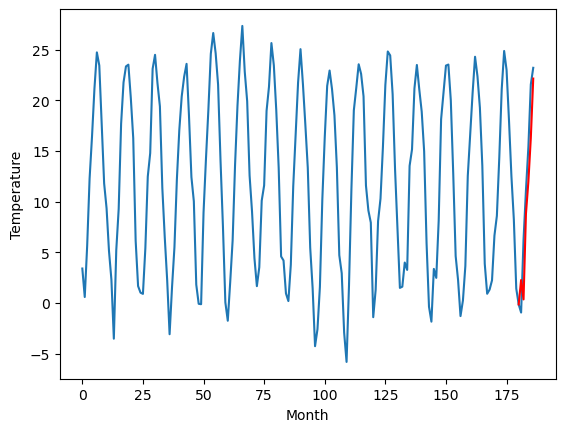

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    2.92   2.271752
1                 1    7.75   7.971752
2                 2    8.28   6.091752
3                 3    6.19   6.721752
4                 4    5.10   5.641752
5                 5    2.80   3.321752
6                 6    5.60   4.401752
7                 7   -7.69  -9.168248
8                 8   10.79   8.641752
9                 9    6.02   8.111752
10               10    1.64   2.271752


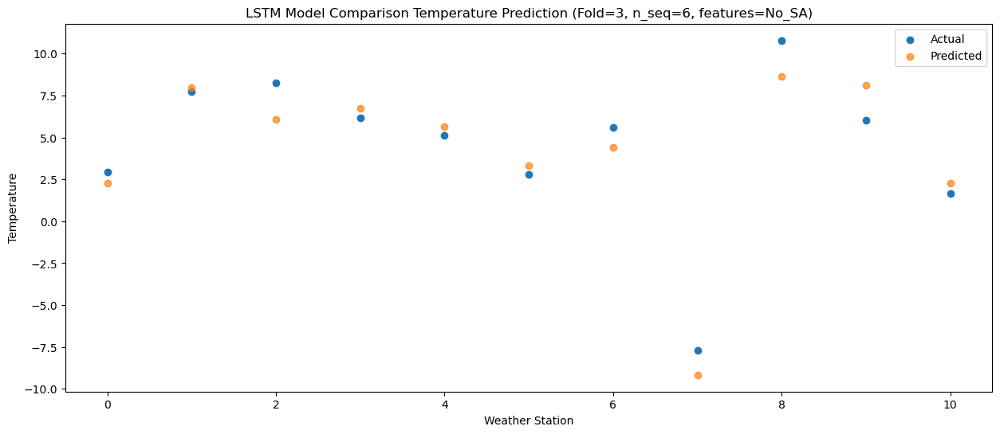

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.29   0.361966
1                 1    4.03   6.061966
2                 2   10.58   4.181966
3                 3    4.87   4.811966
4                 4    1.23   3.731966
5                 5    0.08   1.411966
6                 6    5.70   2.491966
7                 7   -4.84 -11.078034
8                 8   11.72   6.731966
9                 9    5.90   6.201966
10               10    0.84   0.361966


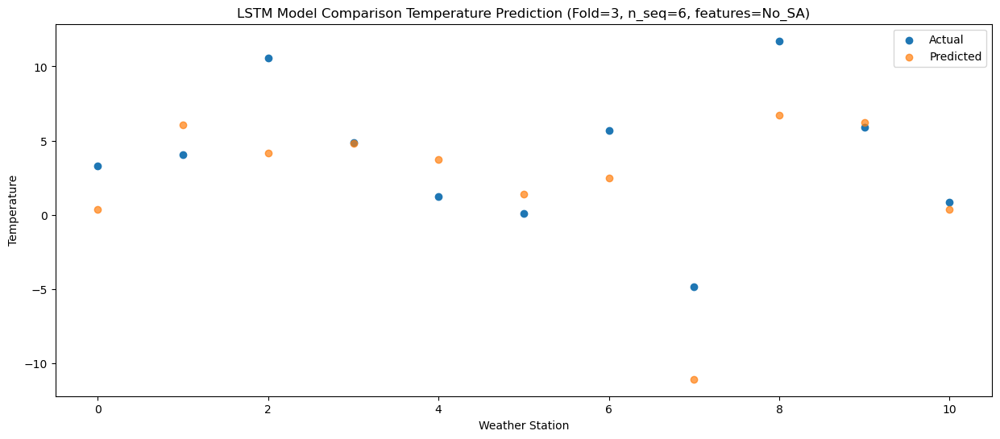

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   10.09   8.826389
1                 1   16.00  14.526389
2                 2   11.73  12.646389
3                 3   15.08  13.276389
4                 4   14.31  12.196389
5                 5   11.41   9.876389
6                 6    8.67  10.956389
7                 7   -3.24  -2.613611
8                 8   11.50  15.196389
9                 9   10.90  14.666389
10               10    8.03   8.826389


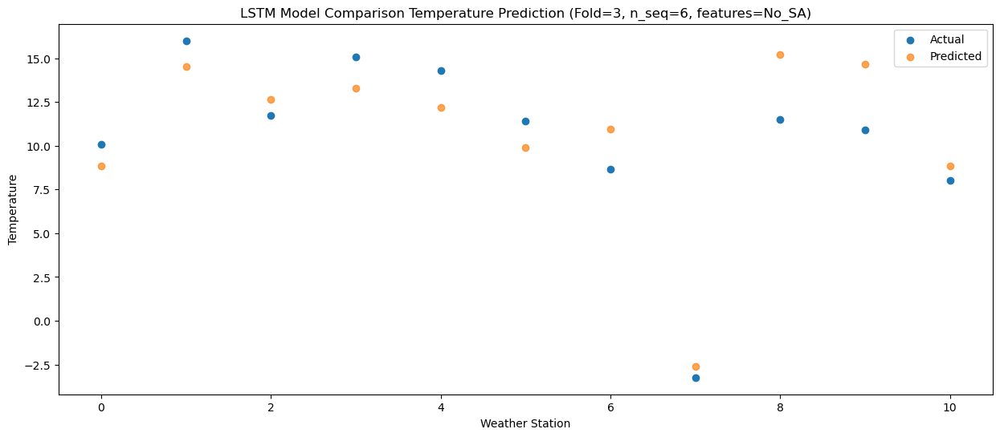

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   13.25  11.989523
1                 1   17.86  17.689523
2                 2   17.46  15.809523
3                 3   17.43  16.439523
4                 4   17.60  15.359523
5                 5   14.86  13.039523
6                 6   13.45  14.119523
7                 7    4.73   0.549523
8                 8   13.69  18.359523
9                 9   15.52  17.829523
10               10   12.90  11.989523


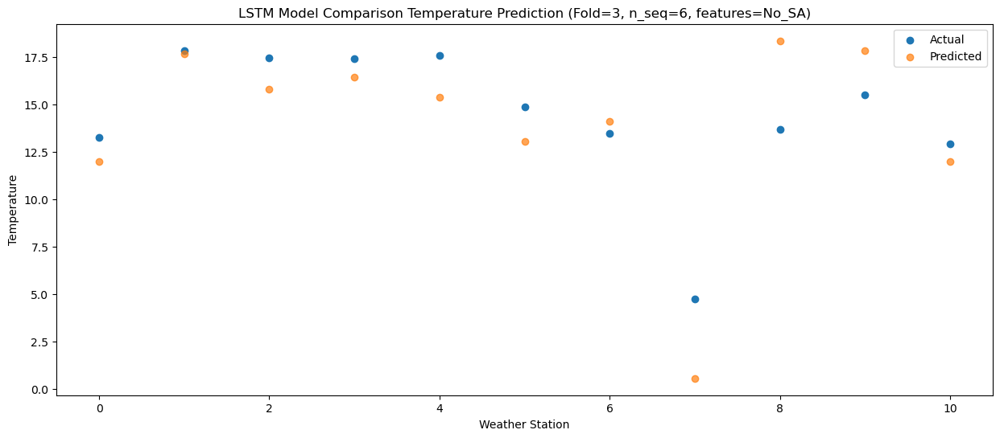

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   16.91  16.271379
1                 1   22.08  21.971379
2                 2   22.26  20.091379
3                 3   21.50  20.721379
4                 4   22.17  19.641379
5                 5   19.14  17.321379
6                 6   18.50  18.401379
7                 7    9.16   4.831379
8                 8   17.98  22.641379
9                 9   20.35  22.111379
10               10   17.16  16.271379


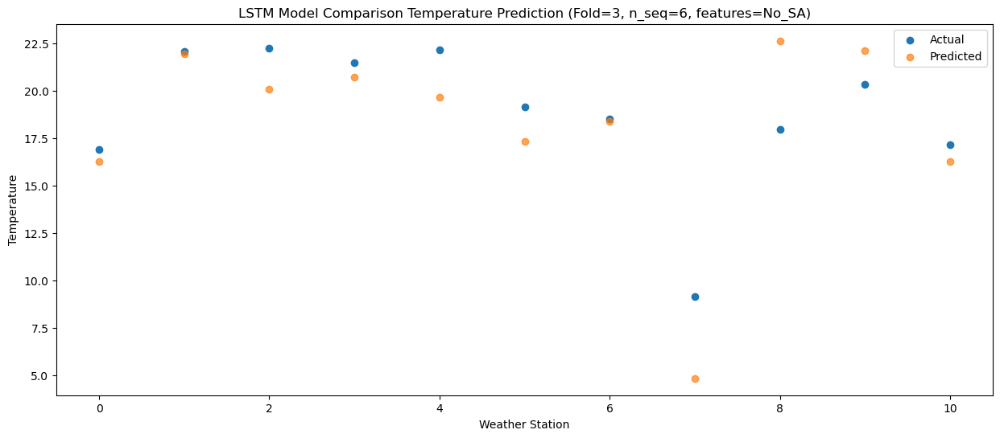

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   20.97   22.14052
1                 1   28.79   27.84052
2                 2   27.11   25.96052
3                 3   27.42   26.59052
4                 4   29.65   25.51052
5                 5   25.85   23.19052
6                 6   25.89   24.27052
7                 7   16.80   10.70052
8                 8   19.68   28.51052
9                 9   26.22   27.98052
10               10   23.33   22.14052


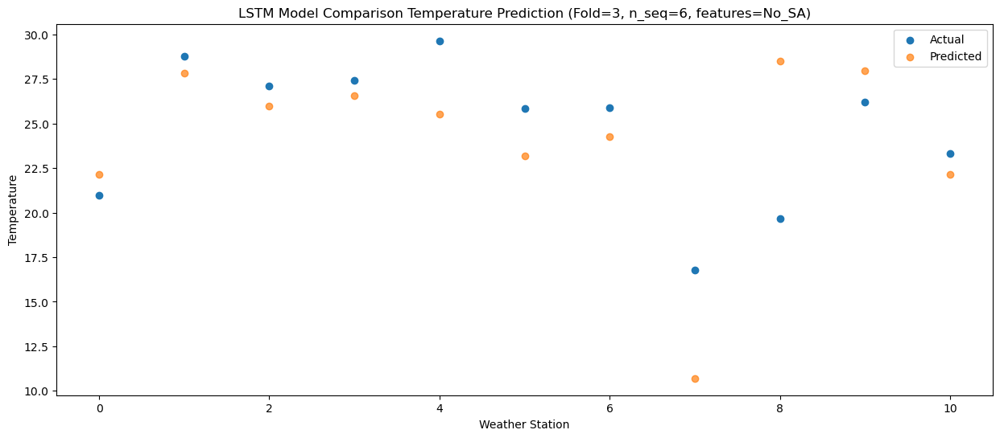

f, t:
[[ 2.92  7.75  8.28  6.19  5.1   2.8   5.6  -7.69 10.79  6.02  1.64]
 [ 3.29  4.03 10.58  4.87  1.23  0.08  5.7  -4.84 11.72  5.9   0.84]
 [10.09 16.   11.73 15.08 14.31 11.41  8.67 -3.24 11.5  10.9   8.03]
 [13.25 17.86 17.46 17.43 17.6  14.86 13.45  4.73 13.69 15.52 12.9 ]
 [16.91 22.08 22.26 21.5  22.17 19.14 18.5   9.16 17.98 20.35 17.16]
 [20.97 28.79 27.11 27.42 29.65 25.85 25.89 16.8  19.68 26.22 23.33]]
[[  2.27175243   7.97175243   6.09175243   6.72175243   5.64175243
    3.32175243   4.40175243  -9.16824757   8.64175243   8.11175243
    2.27175243]
 [  0.36196597   6.06196597   4.18196597   4.81196597   3.73196597
    1.41196597   2.49196597 -11.07803403   6.73196597   6.20196597
    0.36196597]
 [  8.82638915  14.52638915  12.64638915  13.27638915  12.19638915
    9.87638915  10.95638915  -2.61361085  15.19638915  14.66638915
    8.82638915]
 [ 11.98952253  17.68952253  15.80952253  16.43952253  15.35952253
   13.03952253  14.11952253   0.54952253  18.35952253  17.8295

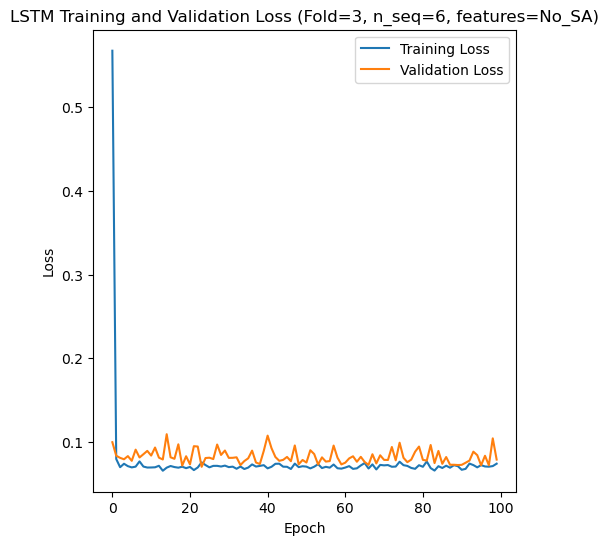

[[ 4.89  1.26  7.78 ... 22.59 18.46  9.82]
 [15.38 13.87 17.63 ... 26.66 22.89 20.2 ]
 [11.49  8.39 14.48 ... 24.97 20.83 17.82]
 ...
 [ 7.64  3.61 10.44 ... 21.3  17.62 11.34]
 [ 4.26  0.29  5.21 ... 21.47 15.54  9.34]
 [ 3.62 -0.32  6.05 ... 19.99 14.92  8.29]]
Epoch 1/100
84/84 [==============================] - 45s 291ms/step - loss: 0.8457 - accuracy: 0.6429 - mae: 0.7660 - rmse: 0.8457 - mape: 129.9556 - pearson: 0.6589 - val_loss: 0.0947 - val_accuracy: 0.7000 - val_mae: 0.0743 - val_rmse: 0.0947 - val_mape: 14.5762 - val_pearson: 0.7153
Epoch 2/100
84/84 [==============================] - 17s 208ms/step - loss: 0.0779 - accuracy: 0.7738 - mae: 0.0637 - rmse: 0.0779 - mape: 11.0682 - pearson: 0.7782 - val_loss: 0.0798 - val_accuracy: 0.7000 - val_mae: 0.0647 - val_rmse: 0.0798 - val_mape: 11.5952 - val_pearson: 0.8204
Epoch 3/100
84/84 [==============================] - 18s 221ms/step - loss: 0.0721 - accuracy: 0.7262 - mae: 0.0582 - rmse: 0.0721 - mape: 10.1685 - pearson: 0.783

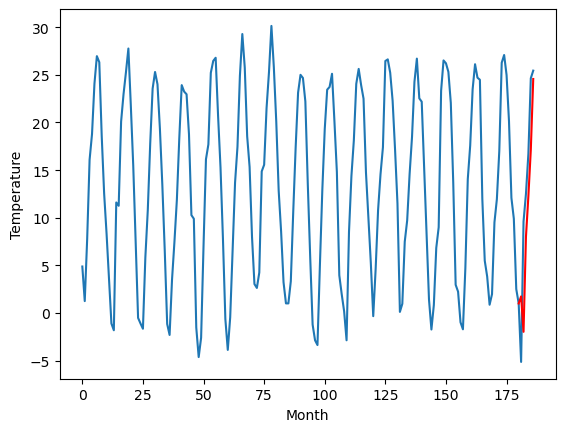

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.59		3.02		-2.57
9.02		-0.69		-9.71
10.62		9.28		-1.34
12.06		13.55		1.49
16.10		18.40		2.30
17.73		25.83		8.10
[180, 181, 182, 183, 184, 185, 186]
[14.25, 3.0237219476699826, -0.6922049379348758, 9.27610064983368, 13.550196661949158, 18.402452483177186, 25.83285047054291]


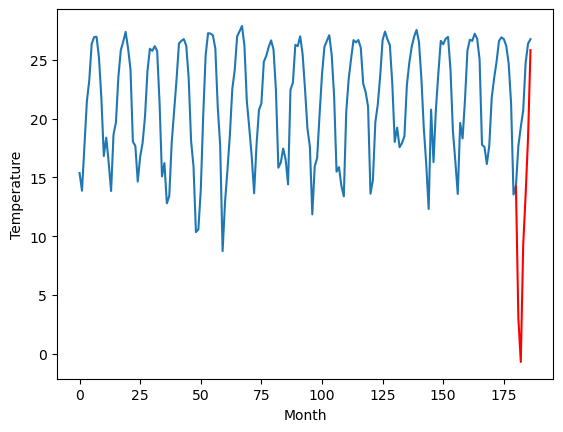

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
15.41		13.51		-1.90
13.49		9.80		-3.69
22.82		19.77		-3.05
23.89		24.04		0.15
28.36		28.89		0.53
32.62		36.32		3.70
[180, 181, 182, 183, 184, 185, 186]
[9.06, 13.513721947669984, 9.797795062065125, 19.76610064983368, 24.04019666194916, 28.892452483177188, 36.32285047054291]


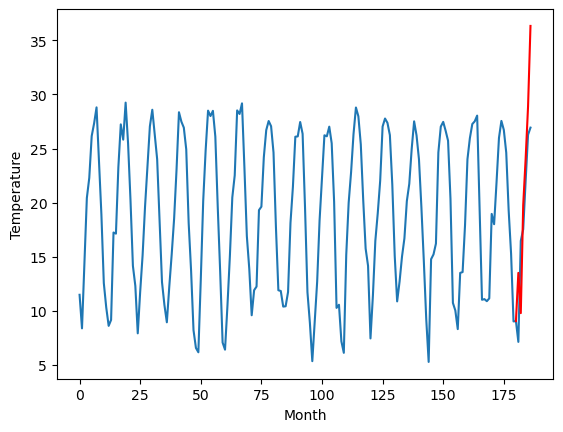

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.57		9.62		-0.95
7.11		5.91		-1.20
18.07		15.88		-2.19
19.76		20.15		0.39
23.92		25.00		1.08
29.60		32.43		2.83
[180, 181, 182, 183, 184, 185, 186]
[7.48, 9.623721947669983, 5.907795062065125, 15.87610064983368, 20.15019666194916, 25.002452483177187, 32.43285047054291]


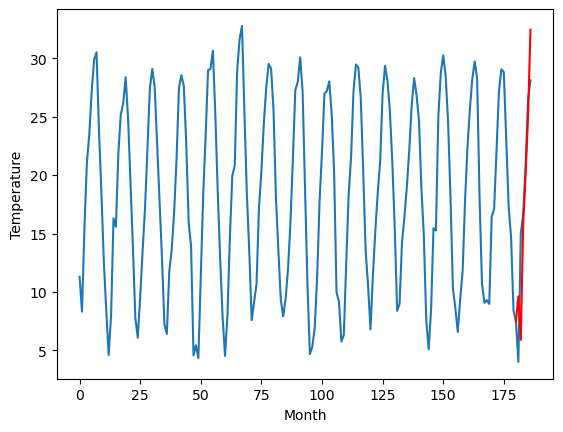

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.71		9.44		-1.27
6.82		5.73		-1.09
17.74		15.70		-2.04
19.92		19.97		0.05
23.45		24.82		1.37
30.30		32.25		1.95
[180, 181, 182, 183, 184, 185, 186]
[7.33, 9.443721947669983, 5.727795062065125, 15.69610064983368, 19.97019666194916, 24.822452483177187, 32.25285047054291]


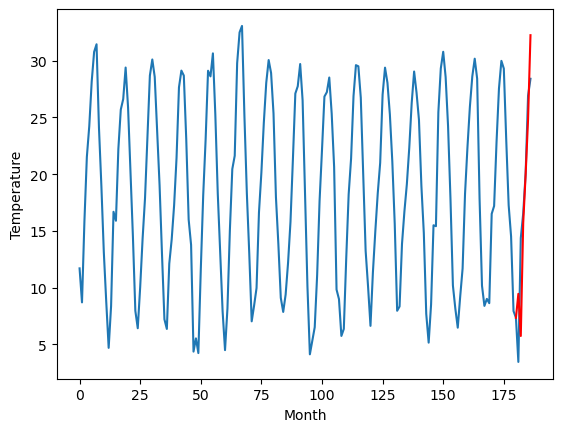

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.59		9.82		-0.77
9.02		6.11		-2.91
18.27		16.08		-2.19
20.50		20.35		-0.15
25.99		25.20		-0.79
30.95		32.63		1.68
[180, 181, 182, 183, 184, 185, 186]
[6.59, 9.823721947669982, 6.107795062065124, 16.076100649833677, 20.350196661949155, 25.202452483177183, 32.632850470542905]


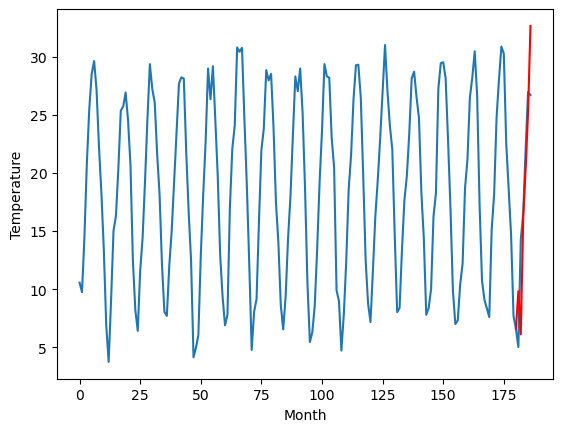

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.79		8.69		-2.10
11.46		4.98		-6.48
17.86		14.95		-2.91
20.59		19.22		-1.37
24.04		24.07		0.03
28.06		31.50		3.44
[180, 181, 182, 183, 184, 185, 186]
[6.04, 8.693721947669983, 4.977795062065125, 14.94610064983368, 19.22019666194916, 24.072452483177187, 31.50285047054291]


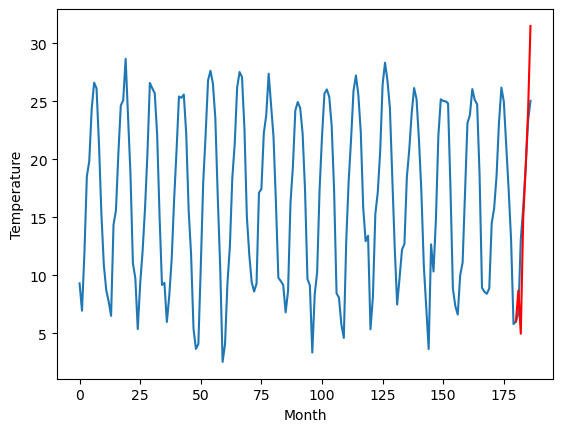

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.65		7.45		-0.20
4.04		3.74		-0.30
16.31		13.71		-2.60
18.21		17.98		-0.23
22.25		22.83		0.58
28.55		30.26		1.71
[180, 181, 182, 183, 184, 185, 186]
[3.13, 7.453721947669983, 3.737795062065125, 13.70610064983368, 17.980196661949158, 22.832452483177185, 30.262850470542908]


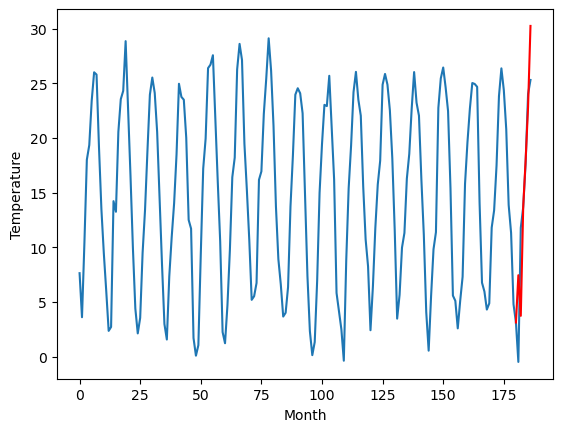

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.06		5.77		-0.29
2.70		2.06		-0.64
14.67		12.03		-2.64
18.32		16.30		-2.02
22.73		21.15		-1.58
29.97		28.58		-1.39
[180, 181, 182, 183, 184, 185, 186]
[-0.29, 5.773721947669983, 2.057795062065124, 12.02610064983368, 16.30019666194916, 21.152452483177186, 28.58285047054291]


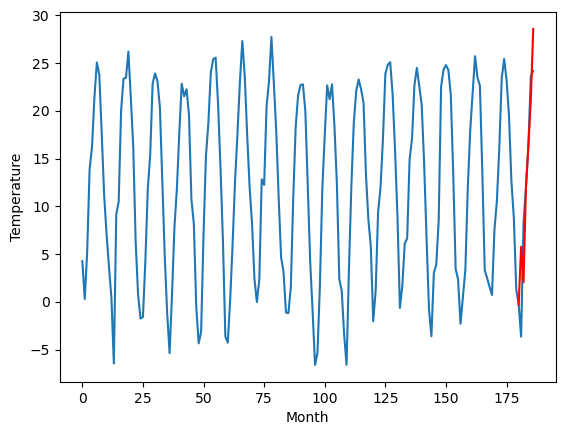

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.23		2.39		0.16
-2.21		-1.32		0.89
11.65		8.65		-3.00
15.36		12.92		-2.44
20.14		17.77		-2.37
27.53		25.20		-2.33
[180, 181, 182, 183, 184, 185, 186]
[-1.03, 2.3937219476699827, -1.3222049379348757, 8.646100649833679, 12.920196661949158, 17.772452483177183, 25.202850470542906]


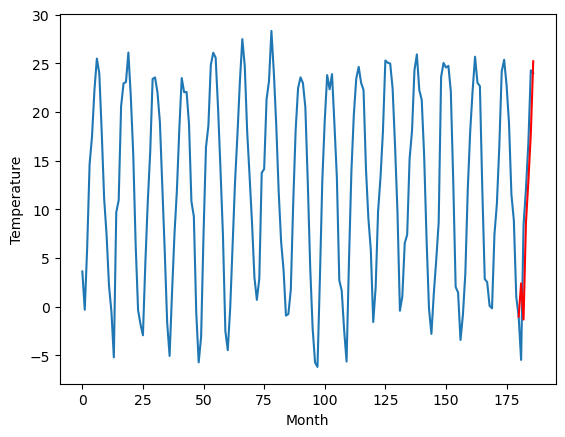

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
1.70		1.75		0.05
-0.54		-1.96		-1.42
9.35		8.01		-1.34
13.15		12.28		-0.87
17.68		17.13		-0.55
24.57		24.56		-0.01
[180, 181, 182, 183, 184, 185, 186]
[-2.29, 1.753721947669983, -1.9622049379348754, 8.00610064983368, 12.280196661949159, 17.132452483177186, 24.56285047054291]


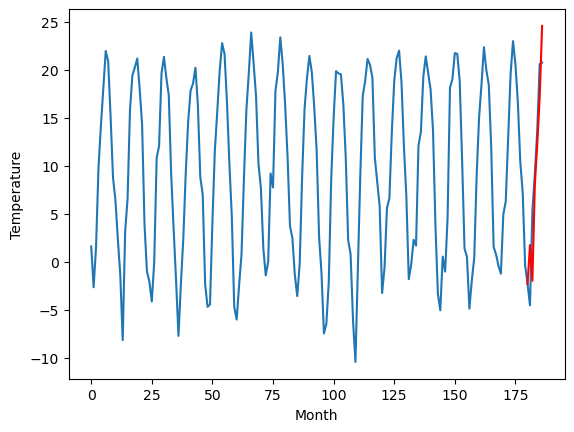

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    2.11   1.753722
1                 1    5.59   3.023722
2                 2   15.41  13.513722
3                 3   10.57   9.623722
4                 4   10.71   9.443722
5                 5   10.59   9.823722
6                 6   10.79   8.693722
7                 7    7.65   7.453722
8                 8    6.06   5.773722
9                 9    2.23   2.393722
10               10    1.70   1.753722


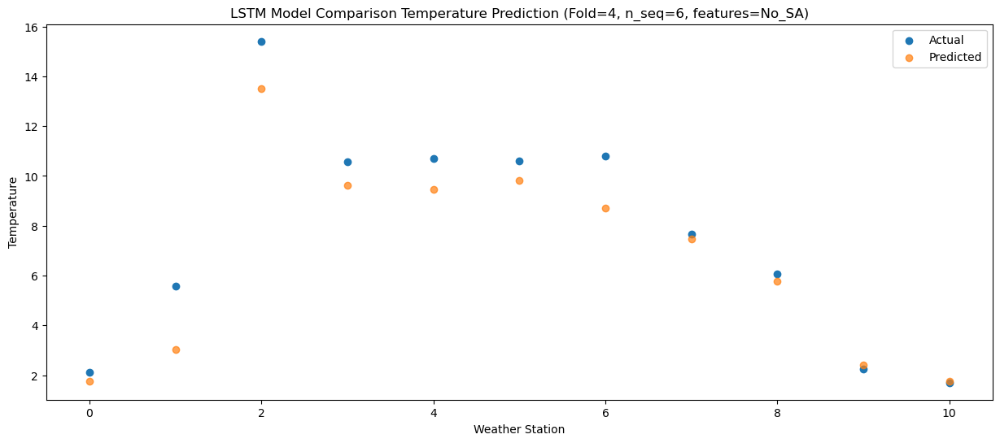

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0   -4.02  -1.962205
1                 1    9.02  -0.692205
2                 2   13.49   9.797795
3                 3    7.11   5.907795
4                 4    6.82   5.727795
5                 5    9.02   6.107795
6                 6   11.46   4.977795
7                 7    4.04   3.737795
8                 8    2.70   2.057795
9                 9   -2.21  -1.322205
10               10   -0.54  -1.962205


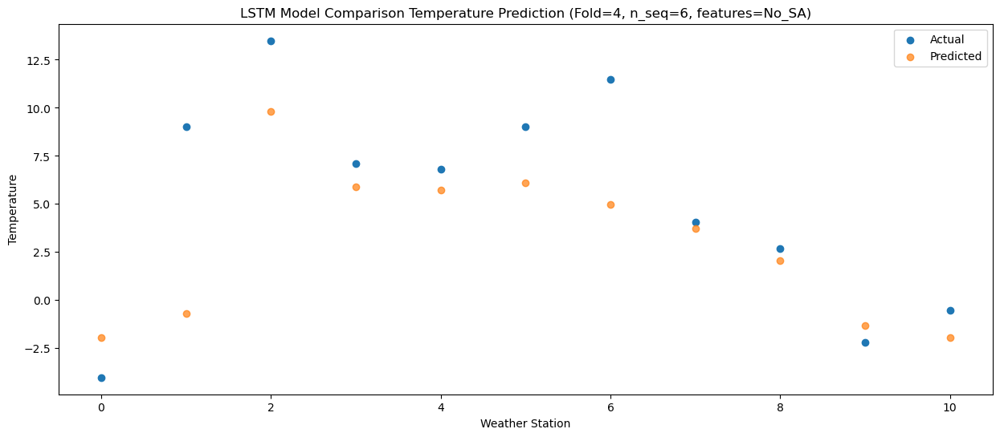

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   10.71   8.006101
1                 1   10.62   9.276101
2                 2   22.82  19.766101
3                 3   18.07  15.876101
4                 4   17.74  15.696101
5                 5   18.27  16.076101
6                 6   17.86  14.946101
7                 7   16.31  13.706101
8                 8   14.67  12.026101
9                 9   11.65   8.646101
10               10    9.35   8.006101


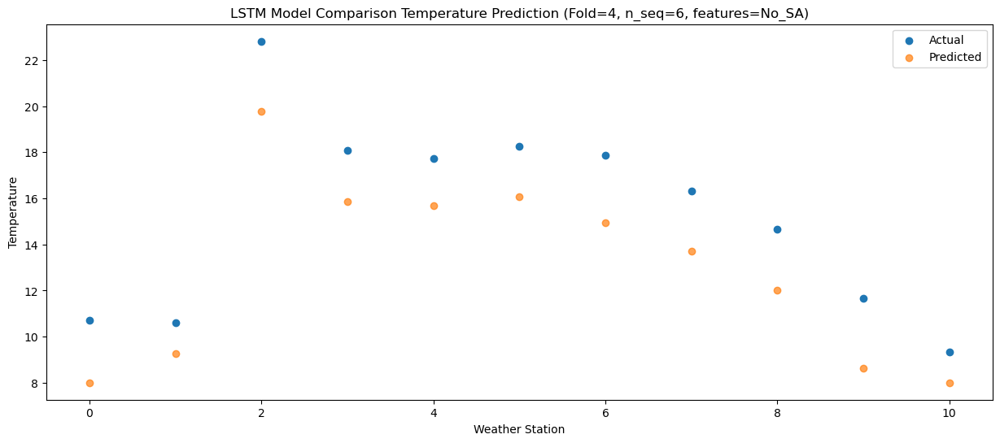

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   13.62  12.280197
1                 1   12.06  13.550197
2                 2   23.89  24.040197
3                 3   19.76  20.150197
4                 4   19.92  19.970197
5                 5   20.50  20.350197
6                 6   20.59  19.220197
7                 7   18.21  17.980197
8                 8   18.32  16.300197
9                 9   15.36  12.920197
10               10   13.15  12.280197


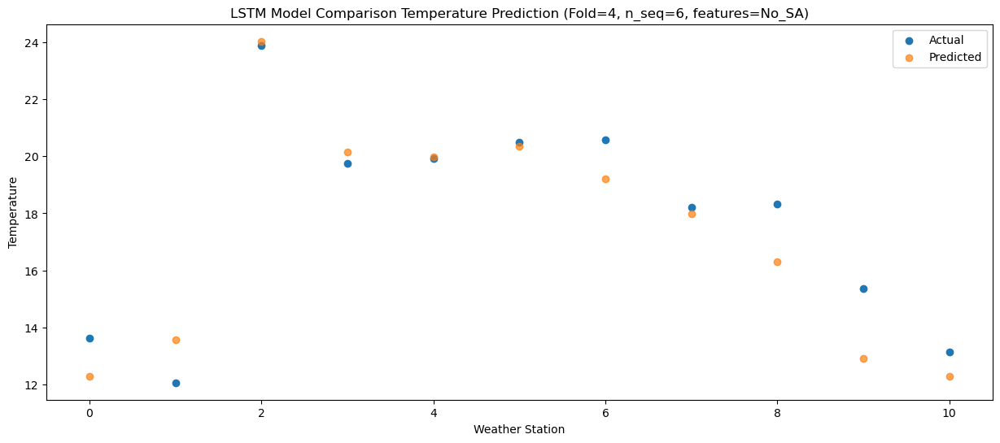

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   17.83  17.132452
1                 1   16.10  18.402452
2                 2   28.36  28.892452
3                 3   23.92  25.002452
4                 4   23.45  24.822452
5                 5   25.99  25.202452
6                 6   24.04  24.072452
7                 7   22.25  22.832452
8                 8   22.73  21.152452
9                 9   20.14  17.772452
10               10   17.68  17.132452


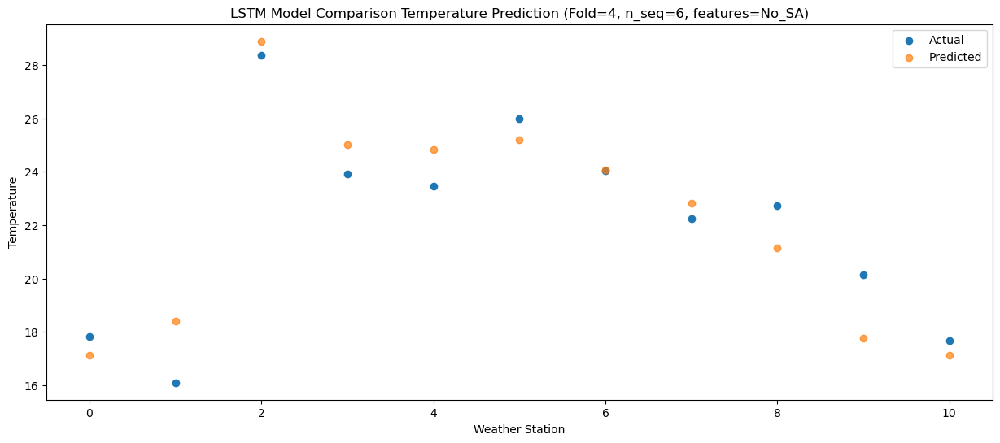

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   25.74   24.56285
1                 1   17.73   25.83285
2                 2   32.62   36.32285
3                 3   29.60   32.43285
4                 4   30.30   32.25285
5                 5   30.95   32.63285
6                 6   28.06   31.50285
7                 7   28.55   30.26285
8                 8   29.97   28.58285
9                 9   27.53   25.20285
10               10   24.57   24.56285


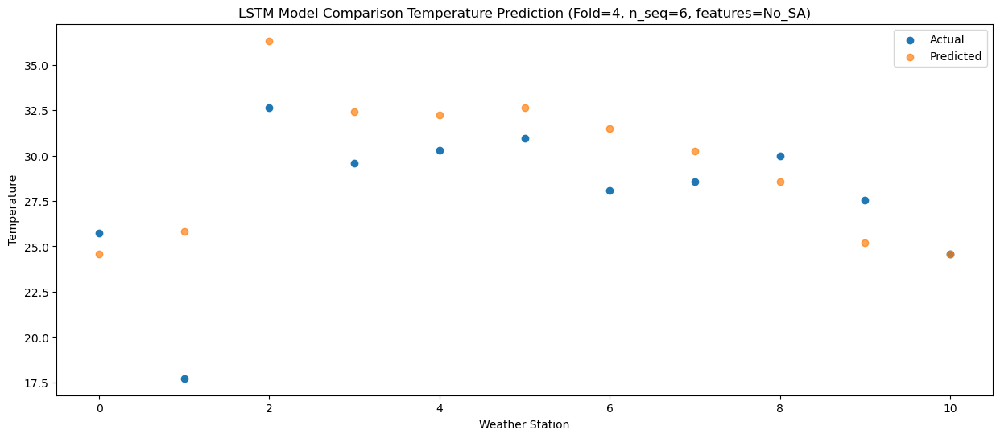

f, t:
[[ 2.11  5.59 15.41 10.57 10.71 10.59 10.79  7.65  6.06  2.23  1.7 ]
 [-4.02  9.02 13.49  7.11  6.82  9.02 11.46  4.04  2.7  -2.21 -0.54]
 [10.71 10.62 22.82 18.07 17.74 18.27 17.86 16.31 14.67 11.65  9.35]
 [13.62 12.06 23.89 19.76 19.92 20.5  20.59 18.21 18.32 15.36 13.15]
 [17.83 16.1  28.36 23.92 23.45 25.99 24.04 22.25 22.73 20.14 17.68]
 [25.74 17.73 32.62 29.6  30.3  30.95 28.06 28.55 29.97 27.53 24.57]]
[[ 1.75372195  3.02372195 13.51372195  9.62372195  9.44372195  9.82372195
   8.69372195  7.45372195  5.77372195  2.39372195  1.75372195]
 [-1.96220494 -0.69220494  9.79779506  5.90779506  5.72779506  6.10779506
   4.97779506  3.73779506  2.05779506 -1.32220494 -1.96220494]
 [ 8.00610065  9.27610065 19.76610065 15.87610065 15.69610065 16.07610065
  14.94610065 13.70610065 12.02610065  8.64610065  8.00610065]
 [12.28019666 13.55019666 24.04019666 20.15019666 19.97019666 20.35019666
  19.22019666 17.98019666 16.30019666 12.92019666 12.28019666]
 [17.13245248 18.40245248 28.89

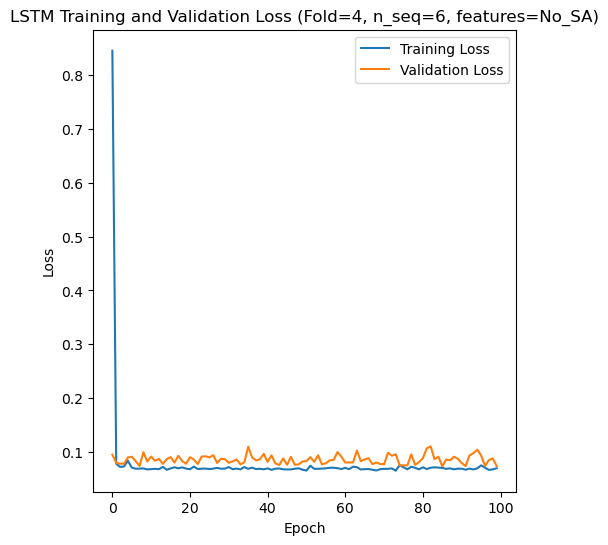

[[2.2330336515202114], [1.702856233705319], [3.935466449279191], [2.680268874560448], [2.4768288273986374]]
[[array(2.23303365)], [array(1.70285623)], [array(3.93546645)], [array(2.68026887)], [array(2.47682883)]]
[[1.8497607658126143], [1.44143035252889], [2.9759645583412855], [2.030187562451218], [1.7841316317067006]]
[[0.18068484896874978], [0.11072907933173953], [0.2516010911624273], [0.4909235513557942], [0.1818607966303286]]
[[0.9181950942796339], [0.9483087374657777], [0.7729130831926336], [0.9021015266000902], [0.9218895949518123]]
[[array(0.09056342)], [array(0.11072908)], [array(0.25160109)], [array(0.44018386)], [array(0.07436627)]]
[[array(0.95150397)], [array(0.96570235)], [array(0.86019493)], [array(0.91398875)], [array(0.94492035)]]
[ 4.43  1.08 12.15 13.68 18.18 22.85 12.87 12.78 17.84 19.24 23.26 26.74
 15.34 16.2  22.18 23.82 27.8  31.94  9.    7.43 15.34 17.13 21.1  24.38
 13.35 10.26 20.16 22.09 25.95 31.15 11.52 12.17 17.07 20.44 23.95 28.52
 10.21 10.85 17.83 18.8

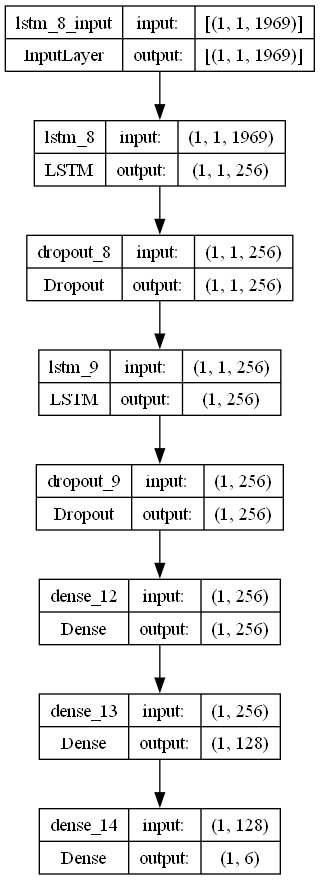

In [2]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def kmape (y_true, y_pred):
    return K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def kpearson (y_true, y_pred):
    mean_true = K.mean(y_true)
    mean_pred = K.mean(y_pred)
    return (K.square(K.mean((y_true - mean_true)*(y_pred - mean_pred))))/(K.mean(K.square(y_true - mean_true))*K.mean(K.square(y_pred - mean_pred)))

# fit best LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from best model
    lr =  0.03857497044166924 
    optimizer = Adam(learning_rate = lr)
    activation_function = 'relu'
    lstm_units = 256
    dropout_rate = 0.19386836191566603

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# Make one forecast with LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(actual, forecasts, n_lag, n_seq):

    t = np.array(actual).transpose()
    f = np.array(forecasts).transpose()

    print("f, t:")
    print(t)
    print(f)
    rmse_list = []
    mae_list = []
    skmape_list = []
    mape_list = []
    r2_list = []
    pearson_list = []
    actual_list = []

    for i in range(n_seq):
        act = [row for row in t[i]]
        predicted = [forecast for forecast in f[i]]
        rmse1 = sqrt(mean_squared_error(act, predicted))
        rmse2 = np.array(rmse(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        mae = mean_absolute_error(act, predicted)
        mse = mean_squared_error(act, predicted)
        skmape = mean_absolute_percentage_error(act, predicted)
        kmape1 = np.array(kmape(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        kpearson1 = np.array(kpearson(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        r2 = r2_score(act, predicted) 
        avg_actual = np.mean(act)
        print("Year at t+"+str(i+1)+":")
        print('t+%d SKRMSE: %f' % ((i+1), rmse1))
        print('t+%d KRMSE: %f' % ((i+1), rmse2))        
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d SKMAPE: %f' % ((i+1), skmape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))
        print('t+%d KMAPE: %f' % ((i+1), kmape1))
        print('t+%d PEARSON: %f' % ((i+1), kpearson1))
        print('t+%d AVERAGE ACTUAL: %f' % ((i+1), avg_actual))

    y_true = tf.convert_to_tensor(np.array(actual).flatten())
    y_pred = tf.convert_to_tensor(np.array(forecasts).flatten())

    rmse1 = sqrt(mean_squared_error(np.array(y_true), np.array(y_pred)))
    rmse2 = np.array(rmse(y_true, y_pred))
    mae = mean_absolute_error(np.array(y_true), np.array(y_pred))
    mse = mean_squared_error(np.array(y_true), np.array(y_pred))
    skmape = mean_absolute_percentage_error(np.array(y_true), np.array(y_pred))
    kmape1 = np.array(kmape(y_true, y_pred))
    kpearson1 = np.array(kpearson(y_true, y_pred))
    r2 = r2_score(np.array(y_true), np.array(y_pred)) 
    avg_actual = np.mean(np.array(y_true))
    rmse1_list.append(rmse1)
    rmse2_list.append(rmse2)
    mae_list.append(mae)
    skmape_list.append(skmape)
    pearson_list.append(kpearson1)
    mape_list.append(kmape1)
    r2_list.append(r2)
    actual_list.append(avg_actual)
    print("Metrics for this Fold:")
    print('SKRMSE: %f' % (rmse1))
    print('KRMSE: %f' % (rmse2))        
    print('MAE: %f' % (mae))
    print('SKMAPE: %f' % (skmape))
    print('R2_SCORE: %f' % (r2))
    print('KMAPE: %f' % (kmape1))
    print('PEARSON: %f' % (kpearson1))
    print('AVERAGE ACTUAL: %f' % (avg_actual))

    return rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, actual, n_test, n_seq, n_lag):
    # Plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # Plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Temperature")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse1_avg_list = []
rmse2_avg_list = []
mae_avg_list = []
skmape_avg_list = []
r2_score_avg_list = []
mape_avg_list = []
pearson_avg_list = []
actual_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]
    
    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    print(dataset)

    series = pd.Series(dataset[:, 0]) # Using first column (temperatures)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))
    
    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test, n_seq)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    print(results_df)
    
    print("Actual and Forecasts:")
    print(actual)
    print(forecasts)
    
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        actual_ws = actual[j]
        
        plot_forecasts(series_ws, forecasts_ws, actual_ws, n_test, n_seq, n_lag)

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)

        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='LSTM Model Comparison Temperature Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_SA)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Temperature')
        plt.legend()
        plt.show()

    rmse1_list = [] # list stores sklearn's root mean squared errors for each future time prediction
    rmse2_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores mean absolute errors for each future time prediction
    skmape_list = [] # list stores sklearn's mean squared percentage errors for each future time prediction
    r2_list = [] # list stores sklearn's r2 pearson values for each future time prediction
    mape_list = [] # list stores mean squared percentage errors for each future time prediction
    pearson_list = [] # list stores r2 pearson values for each future time prediction
    actual_list = [] # list stores average actual values for each future time prediction

    # evaluate forecasts
    rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse1_avg_list.append(rmse1_list)
    rmse2_avg_list.append(rmse2_list)
    mae_avg_list.append(mae_list)
    skmape_avg_list.append(skmape_list)
    r2_score_avg_list.append(r2_list)
    mape_avg_list.append(mape_list)
    pearson_avg_list.append(pearson_list)
    actual_avg_list.append(actual_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)
            
    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_SA)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse1_avg_list)
print(rmse2_avg_list)
print(mae_avg_list)
print(skmape_avg_list)
print(r2_score_avg_list)
print(mape_avg_list)
print(pearson_avg_list)
print(np.array(actual_results).flatten())
print(np.array(forecast_results).flatten())
a2 = np.array(actual_results).flatten()
f2 = np.array(forecast_results).flatten()
p1 = np.array(pearson(tf.convert_to_tensor(a2), tf.convert_to_tensor(f2)))
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse1_avg_list)
print("Average SKRMSE:"+str(np.mean(rmse1_avg_list)))
print("Average KRMSE:"+str(np.mean(rmse2_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average SKMAPE:"+str(np.mean(skmape_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average PEARSON:"+str(p1))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "lstm_model_optimized_CV_S6_No_SA.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)